
###***CÓDIGO PRINCIPAL***
--------------------------------------------
# ***REDUCCIÓN DE FALSAS ALARMAS DE ARRITMIAS CARDÍACAS EN UNIDADES DE CUIDADOS INTENSIVOS (PMHS-DL-231)***

----------------------------------------------
                      Director: Carlos Augusto Fajardo Ariza
                      Autores: Karol Milena Ardila - Germán Moreno Jaimes
Presentado al Comité de Trabajos de Grado: E3T.

Universidad Industrial de Santander.

2023-2.

------------------------------------------------------------

***INTRODUCCIÓN***

Este proyecto busca reducir el número de falsas alarmas de arritmias cardiacas, evitando la supresión de alarmas verdaderas en las UCIs. Este modelo está entrenado a partir de la base de datos del PhysioNet/Computing in Cardiology Challenge 2015. Un set de datos con 750 registros. Cada una de las secciones está documentada y el indice de variables se encuentra a continuación.

---
***INDICE DE VARIABLES*** (Por editar)

1. **file_list**: Lista de archivos .MAT de la carpeta.
2. **sorted_file_list**: Lista de archivos .MAT ordenados de forma ascendente.



---


#Conexión con Drive

###Pasos para correr el notebook:
1. Crear una copia de este folder (datos+código) en el drive personal
2. Correr la primer línea de código.
3. Cambiar la variable 'data_path' con la localización del folder copiado.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


#Importación de Librerías


In [2]:
!pip install iterative-stratification
!pip install wfdb
!pip install tsgm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.0/160.0 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.3/65.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 5.5 MB/s eta 0:00:00
  Created wheel for tsgm: filename=tsgm-0.0.5-py3-none-any.whl size=57108 sha256=4f2cd784dd05940865c89a1f72f8077f149985b77d5abc9bf9df393fdee02687
  Stored in directory: /root/.cache/pip/wheels/f3/04/27/7d080cdaf3c4a00fc1accf8066ad2581cdd3da04b6b381c411
  Created wheel for antropy: filename=antropy-0.1.6-py3-none-any.whl size=16879 sha256=375a841d65917bf3afa410ccda64a06dab2b129613290b4e041f5d575c995abf
  Stored in direct

In [3]:
#LIBERIAS
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.io as sio
import re
import wfdb
from tabulate import tabulate
from iterstrat.ml_stratifiers import MultilabelStratifiedKFold
import scipy

#model libraries
import tensorflow as tf
from sklearn.model_selection import StratifiedKFold
from tensorflow import keras
from keras import layers
#from keras.utils import np_utils
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, confusion_matrix
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import roc_curve, auc
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, BatchNormalization, ReLU, GlobalMaxPooling1D, Dense, Dropout, Permute, Reshape
import tensorflow as tf
import keras
from keras import models, layers
from keras.layers import concatenate
import tensorflow as tf
import keras
from keras import models, layers


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, classification_report
from tensorflow.keras.optimizers import Adam
from keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint


from sklearn.model_selection import StratifiedShuffleSplit
from keras.optimizers import Adam
from sklearn.utils.class_weight import compute_class_weight
from keras.models import Model
from sklearn.metrics import f1_score
import numpy as np
from keras.models import clone_model
from keras.utils import to_categorical
from tensorflow.keras import layers, models, regularizers
from sklearn.model_selection import StratifiedKFold

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
from tensorflow import keras
import tsgm

# Consideraciones relevantes en relación a los datos: Aspectos esenciales a tener en cuenta

Los datos se encuentran almacenados en dos formatos distintos, específicamente en dos archivos con extensiones .HEA y .MAT por cada registro, totalizando 750 registros. Con el objetivo de optimizar la velocidad de procesamiento y la eficiencia del uso de la memoria RAM en el entorno de Google Colab, se llevó a cabo la conversión de los archivos con extensión .MAT a un formato alternativo, en este caso, .H5. El código correspondiente a este proceso se encuentra disponible en el archivo denominado "CONVERSOR_MAT_TO_H5".

**El conjunto de datos tiene 5 tipos de arritmias :**

* 1: Asistolia(a)
* 2: Bradicardia extrema(b)
* 3: Taquicardia extrema(t)
* 4: Taquicardia Ventricular(v)
* 5: Aleteo/Fibrilación ventricular(f)

Desde el mismo nombre de archivo del registro, se puede inferir cierta información. Ejemplo: "v100s" se puede descomponer en:


*   La primer letra (en este caso la v) significa el tipo de arritmia que es según la lista ya presentada.
*   Los tres números del medio son el número de dato (van desde el 100 hasta el 849).
*   La última letra (en este caso la s) habla de la duración de la señal. Para s(duración de 300s) y para l (duración de 330s).



In [4]:
#ACCEDIENDO A LOS DATOS..

#Conexión al drive
data_path = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/Señales normales/Datos_h5 y HEA"

----------------------------------------------
#Pre-procesado y visualización de los datos
----------------------------------------------
La finalidad de esta sección consiste en cargar los datos, realizar una previsualización y llevar a cabo una preparación inicial de los mismos, procedimiento comúnmente denominado como "preprocesamiento de datos"

In [ ]:
# Se obtiene la lista de archivos .MAT Ty .HEA de la carpeta
file_list_h5 = [file for file in os.listdir(data_path) if file.endswith('.h5')]
file_list_hea = [file for file in os.listdir(data_path) if file.endswith('.hea')]

# Función parar ordenar por número las señales
def sort_by_numbers(file_name):
    # Se ordena por los tres números del interior del nombre del dato
    numbers = re.findall(r'\d{3}', file_name)
    return int(numbers[0])

# Se ordena la lista
sorted_file_list_h5 = sorted(file_list_h5, key=sort_by_numbers)
sorted_file_list_hea = sorted(file_list_hea, key=sort_by_numbers)

# Se ordenan por número
sorted_file_paths_h5 = [os.path.join(data_path, file) for file in sorted_file_list_h5]
sorted_file_paths_hea = [os.path.join(data_path, file[:-4]) for file in sorted_file_list_hea]

In [ ]:
# Visualización de las listas
print(sorted_file_list_h5)
print(sorted_file_list_hea)

['v100s.h5', 'v101l.h5', 'v102s.h5', 'a103l.h5', 'a104s.h5', 'a105l.h5', 't106s.h5', 't107l.h5', 't108s.h5', 'a109l.h5', 't110s.h5', 'v111l.h5', 't112s.h5', 'v113l.h5', 't114s.h5', 'v115l.h5', 't116s.h5', 't117l.h5', 't118s.h5', 'v119l.h5', 'f120s.h5', 'f121l.h5', 'v122s.h5', 'a123l.h5', 'b124s.h5', 'b125l.h5', 'b126s.h5', 'v127l.h5', 'v128s.h5', 'f129l.h5', 'f130s.h5', 'v131l.h5', 'v132s.h5', 'v133l.h5', 'a134s.h5', 'v135l.h5', 'v136s.h5', 'f137l.h5', 'f138s.h5', 'v139l.h5', 'v140s.h5', 'v141l.h5', 'a142s.h5', 'v143l.h5', 'f144s.h5', 'a145l.h5', 'v146s.h5', 'v147l.h5', 'v148s.h5', 't149l.h5', 't150s.h5', 't151l.h5', 'a152s.h5', 'v153l.h5', 'v154s.h5', 'v155l.h5', 't156s.h5', 't157l.h5', 'v158s.h5', 'v159l.h5', 'v160s.h5', 'a161l.h5', 'v162s.h5', 'a163l.h5', 'v164s.h5', 'a165l.h5', 'v166s.h5', 'a167l.h5', 'v168s.h5', 'v169l.h5', 'a170s.h5', 'a171l.h5', 'a172s.h5', 't173l.h5', 't174s.h5', 't175l.h5', 'v176s.h5', 'v177l.h5', 'a178s.h5', 'v179l.h5', 'v180s.h5', 'v181l.h5', 'v182s.h5', 'b1


Es esencial destacar que cada dato se configura como un registro en forma de vector, el cual incorpora dos derivaciones de electrocardiograma (ECG) y al menos una forma de onda pulsátil de fotopletismografía (PPG) o presión arterial invasiva (ABP), sumando un total de tres señales. No obstante, en algunos registros, se observó la presencia simultánea de ambas formas de onda pulsátil o incluso una señal respiratoria, generando así la existencia de cuatro señales. Ante esta variabilidad, se ha implementado la decisión de, en el caso de registros con un total de tres señales, añadir un valor nulo (habitualmente ubicado en la última posición del vector) para mantener la homogeneidad en la estructura de los datos.

In [ ]:
# Inicializar listas para datos
all_data_h5 = []

# Definir la longitud
length = 5 * 60 * 250  # 5 minutos en muestras a 250 Hz

# Procesar registros
for file_path in sorted_file_paths_h5:
    # Cargar el archivo h5
    with h5py.File(file_path, 'r') as file:
        # Obtener las señales del archivo h5
        signals = file['val'][:]

    # Verificar si el registro tiene menos de 4 señales
    while signals.shape[0] < 4:
        # Crear una señal de ceros de la misma longitud que las otras señales
        zero_signal = np.zeros((1, signals.shape[1]))
        # Agregar la señal de ceros a las señales existentes
        signals = np.vstack((signals, zero_signal))

    # Verificar si la señal es más larga que la longitud deseada
    if signals.shape[1] > length:
        # Acortar la señal a la longitud deseada
        signals = signals[:, :length]

    # Agregar las señales a la lista de datos
    all_data_h5.append(signals)

# Verificar el número de datos
print("Número de registros procesados:", len(all_data_h5))

Número de registros procesados: 750


In [ ]:
# Ejemplo para la señal v100s
all_data_h5[0]

array([[ 669,  911,  928, ..., -689, -664, -597],
       [ 133,   31, -152, ..., -452, -467, -467],
       [1218, 1640, 1660, ..., 3748, 3747, 3740],
       [-147, -198, -205, ..., -254, -253, -244]], dtype=int16)

Los archivos ***.hea*** contienen datos destacados de cada registro, las siguientes líneas de código extraen los datos y guarda todas estas características para más adelante.

In [ ]:
all_data_hea = []

# Procesar archivos .hea
for file_path in sorted_file_paths_hea:
    try:
        # Cargar el encabezado del archivo .hea
        record = wfdb.rdheader(file_path)

        # Crear un diccionario con la información del encabezado
        header_info = {
            "record_name": record.record_name,
            "n_sig": record.n_sig,
            "fs": record.fs,
            "counter_freq": record.counter_freq,
            "base_counter": record.base_counter,
            "sig_len": record.sig_len,
            "base_time": record.base_time,
            "base_date": record.base_date,
            "comments": record.comments,
            "sig_name": record.sig_name,
            "file_name": record.file_name,
            "fmt": record.fmt,
            "samps_per_frame": record.samps_per_frame,
            "skew": record.skew,
            "byte_offset": record.byte_offset,
            "adc_gain": record.adc_gain,
            "baseline": record.baseline,
            "units": record.units,
            "adc_res": record.adc_res,
            "adc_zero": record.adc_zero,
            "init_value": record.init_value,
            "checksum": record.checksum,
            "block_size": record.block_size
        }

        # Agregar la información del encabezado a la lista de datos
        all_data_hea.append(header_info)

    except Exception as e:
        print(f"Error al procesar {file_path}: {str(e)}")

# Verificar el número de datos
print("Número de encabezados procesados:", len(all_data_hea))

Número de encabezados procesados: 750


In [ ]:
#ejemplo para la señal v100s
print(all_data_hea[0])

{'record_name': 'v100s', 'n_sig': 4, 'fs': 250, 'counter_freq': None, 'base_counter': None, 'sig_len': 75000, 'base_time': None, 'base_date': None, 'comments': ['Ventricular_Tachycardia', 'False alarm'], 'sig_name': ['II', 'V', 'PLETH', 'RESP'], 'file_name': ['v100s.mat', 'v100s.mat', 'v100s.mat', 'v100s.mat'], 'fmt': ['16', '16', '16', '16'], 'samps_per_frame': [1, 1, 1, 1], 'skew': [None, None, None, None], 'byte_offset': [24, 24, 24, 24], 'adc_gain': [2264.0, 1835.0, 1255.0, 38570.0], 'baseline': [0, 0, 0, 0], 'units': ['mV', 'mV', 'NU', 'NU'], 'adc_res': [16, 16, 16, 16], 'adc_zero': [0, 0, 0, 0], 'init_value': [669, 133, 1218, -147], 'checksum': [8945, -3236, 3038, 2630], 'block_size': [0, 0, 0, 0]}


In [ ]:
#ejemplo para la señal v100s
print(all_data_hea[15])

{'record_name': 'v115l', 'n_sig': 4, 'fs': 250, 'counter_freq': None, 'base_counter': None, 'sig_len': 82500, 'base_time': None, 'base_date': None, 'comments': ['Ventricular_Tachycardia', 'False alarm'], 'sig_name': ['II', 'V', 'PLETH', 'ABP'], 'file_name': ['v115l.mat', 'v115l.mat', 'v115l.mat', 'v115l.mat'], 'fmt': ['16', '16', '16', '16'], 'samps_per_frame': [1, 1, 1, 1], 'skew': [None, None, None, None], 'byte_offset': [24, 24, 24, 24], 'adc_gain': [1248.0, 3483.0, 1568.0, 11780.0], 'baseline': [0, 0, 0, 0], 'units': ['mV', 'mV', 'NU', 'mmHg'], 'adc_res': [16, 16, 16, 16], 'adc_zero': [0, 0, 0, 0], 'init_value': [807, -673, 1615, 32767], 'checksum': [-10133, 27418, 19117, -16964], 'block_size': [0, 0, 0, 0]}


In [ ]:
# Lista para almacenar los nombres de registro y sus sig_name
all_sig_names = []

# Obtener los nombres de registro y sus sig_name para cada registro
for record_info in all_data_hea:
    record_name = record_info["record_name"]
    sig_names = record_info["sig_name"]
    record_sig_names = {"record_name": record_name, "sig_names": sig_names}
    all_sig_names.append(record_sig_names)

# Imprimir el tamaño de la lista
print("El tamaño de la lista es:", len(all_sig_names))

El tamaño de la lista es: 750


In [ ]:
all_sig_names[0]

{'record_name': 'v100s', 'sig_names': ['II', 'V', 'PLETH', 'RESP']}

Dimensiones de las señales después del procesamiento: (4, 75000)


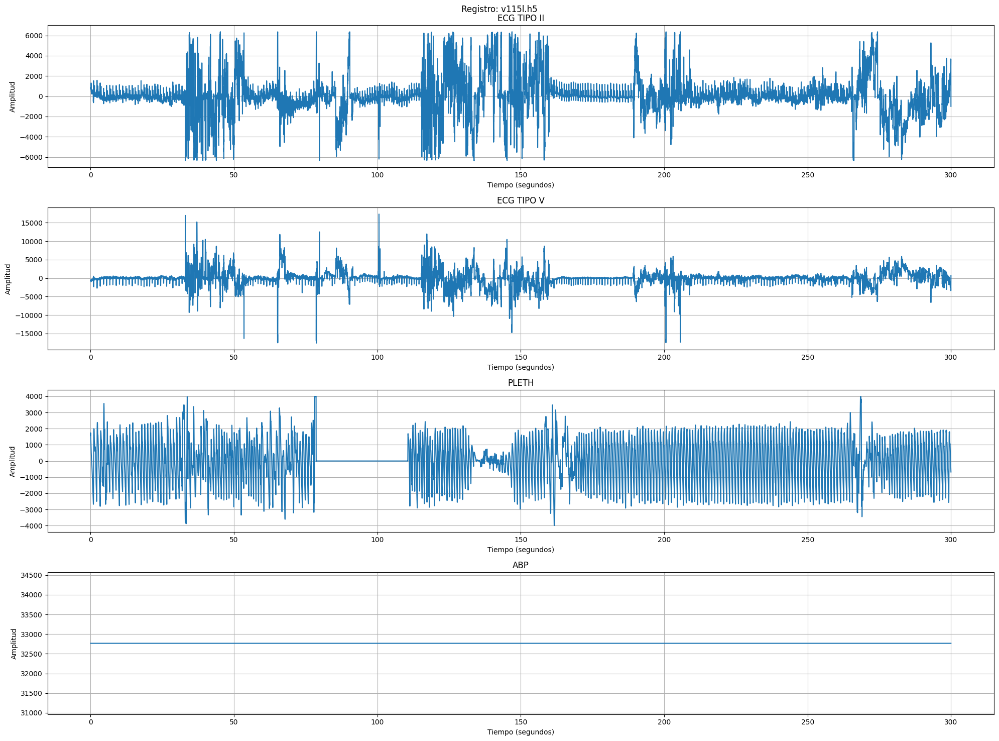

In [ ]:
registro_indice = 15
print("Dimensiones de las señales después del procesamiento:", all_data_h5[registro_indice].shape)

all_data_h5[registro_indice]


nombre_registro = sorted_file_list_h5[registro_indice]
signals = all_data_h5[registro_indice]
tiempo = np.arange(0, len(signals[0])) / 250.0

# Grafica cada señal
plt.figure(figsize=(20,15))
plt.suptitle("Registro: " + nombre_registro)

# Señal 1
plt.subplot(4, 1, 1)
plt.plot(tiempo, signals[0])
plt.title("ECG TIPO II")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)

# Señal 2
plt.subplot(4, 1, 2)
plt.plot(tiempo, signals[1])
plt.title("ECG TIPO V")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)

# Señal 3
plt.subplot(4, 1, 3)
plt.plot(tiempo, signals[2])
plt.title("PLETH")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)

# Señal 4
plt.subplot(4, 1, 4)
plt.plot(tiempo, signals[3])
plt.title("ABP")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)


plt.tight_layout()

plt.show()


Para nuestro propósito, decidimos como una fase del preprocesado buscar cuál era el común denominador en cada una de las posiciones del registro de 4 señales. Siendo sus resultados

##PARA LA PRIMERA POSICIÓN

In [ ]:
# Contador para el total de señales vistas
total_señales_POS1 = 0

# Obtener los nombres de señales en la primera posición para cada registro
sig_names_first_position = [record_info['sig_names'][0] for record_info in all_sig_names]

# Contar las ocurrencias de cada nombre de señal en la primera posición
sig_name_counts_first_position = Counter(sig_names_first_position)

print("Para la primera posición de sig_name se tiene:")
# Imprimir el conteo de ocurrencias para la primera posición
for sig_name, count in sig_name_counts_first_position.items():
    print(f"{sig_name}: {count}")
    total_señales_POS1 += count

# Imprimir el total de señales vistas
print(f"\nTotal de señales vistas: {total_señales_POS1}")


Para la primera posición de sig_name se tiene:
II: 724
I: 13
III: 12
aVF: 1

Total de señales vistas: 750


##PARA LA SEGUNDA POSICIÓN

In [ ]:
# Contador para el total de señales vistas
total_señales_POS2 = 0

# Obtener los nombres de señales en la primera posición para cada registro
sig_names_second_position = [record_info['sig_names'][1] for record_info in all_sig_names]

# Contar las ocurrencias de cada nombre de señal en la primera posición
sig_name_counts_second_position = Counter(sig_names_second_position)

print("Para la segunda posición de sig_name se tiene:")
# Imprimir el conteo de ocurrencias para la segunda posición
for sig_name, count in sig_name_counts_second_position.items():
    print(f"{sig_name}: {count}")
    total_señales_POS2 += count

# Imprimir el total de señales vistas
print(f"\nTotal de señales vistas: {total_señales_POS2}")


Para la segunda posición de sig_name se tiene:
V: 684
III: 27
aVF: 2
MCL: 28
II: 4
aVL: 2
aVR: 3

Total de señales vistas: 750


##PARA LA TERCERA POSICIÓN

In [ ]:
# Contador para el total de señales vistas
total_señales_POS3 = 0

# Obtener los nombres de señales en la primera posición para cada registro
sig_names_third_position = [record_info['sig_names'][2] for record_info in all_sig_names]

# Contar las ocurrencias de cada nombre de señal en la primera posición
sig_name_counts_third_position = Counter(sig_names_third_position)

print("Para la tercera posición de sig_name se tiene:")
# Imprimir el conteo de ocurrencias para la segunda posición
for sig_name, count in sig_name_counts_third_position.items():
    print(f"{sig_name}: {count}")
    total_señales_POS3 += count

# Imprimir el total de señales vistas
print(f"\nTotal de señales vistas: {total_señales_POS3}")


Para la tercera posición de sig_name se tiene:
PLETH: 627
ABP: 123

Total de señales vistas: 750


##PARA LA CUARTA POSICIÓN

In [ ]:
# Contador para el total de señales vistas
total_señales_POS4 = 0

# Obtener los nombres de señales en la última posición para cada registro
sig_names_last_position = [record_info['sig_names'][-1] if len(record_info['sig_names']) == 4 else 0 for record_info in all_sig_names]

# Contar las ocurrencias de cada nombre de señal en la última posición
sig_name_counts_last_position = Counter(sig_names_last_position)

print("Para la última posición de sig_name se tiene:")
# Imprimir el conteo de ocurrencias para la última posición
for sig_name, count in sig_name_counts_last_position.items():
    print(f"{sig_name}: {count}")
    total_señales_POS4 += count

# Imprimir el total de señales vistas
print(f"\nTotal de señales vistas: {total_señales_POS4}")


Para la última posición de sig_name se tiene:
RESP: 278
0: 252
ABP: 220

Total de señales vistas: 750


*** Basándonos en estos resultados, se realizaron intersecciones de datos con el propósito de obtener nuevos conjuntos de datos que carezcan de valores faltantes y que presenten diversas combinaciones de señales cardíacas. A continuación, se detallan las combinaciones resultantes.: ***


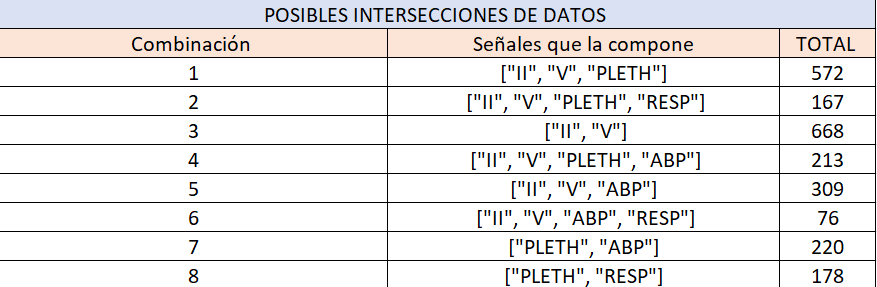

Los registros que tengan estas combinaciones se guardan en una variable con el siguiente código.
##COMBINACIÓN 1 ---  ["II", "V", "PLETH"]  --- TOTAL 572

In [ ]:
# Crear una lista con las combinaciones de señales que estás buscando
combinacion_buscada_1 = ["II", "V", "PLETH"]

# Lista para almacenar los nombres de registros que tienen la combinación buscada
registros_con_combinacion_1= []

# Iterar sobre cada registro
for record_info in all_sig_names:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_1).issubset(record_info['sig_names']):
        registros_con_combinacion_1.append(record_info['record_name'])

# Imprimir los registros que tienen la combinación buscada
#print(f"Registros con la combinación {combinacion_buscada}:")
#for record_name in registros_con_combinacion:
#    print(record_name)

# Imprimir la cantidad total de registros que tienen la combinación buscada
total_registros_con_combinacion = len(registros_con_combinacion_1)
print(f"Total de registros con la combinación 1: {total_registros_con_combinacion}")

Total de registros con la combinación 1: 572


Otro dato importante que se saca de estas combinaciones son los 'comments' de los datos .HEA. Esta sección es importante ya que viene tanto el nombre de la señal como si es falsa o verdadera, sirviendo de base parra . Un ejemplo para el registro v100s es:

*   'comments': ['Ventricular_Tachycardia', 'False alarm']


**NOTA: ESTOS DOS CÓDIGOS SE HICIERON PARA LAS 8 COMBINACIONES, SÓLO QUE CON VARIABLES DIFERENTES**

In [ ]:
# Lista para almacenar las secciones 'comments' de los registros que tienen la combinación buscada
comments_combinacion_1 = {}

# Iterar sobre cada registro
for record_info in all_data_hea:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_1).issubset(record_info.get('sig_name', [])):
        # Obtener el nombre del registro
        record_name = record_info['record_name']

        # Obtener la sección 'comments' y agregarla a la lista
        comments_combinacion_1[record_name] = record_info.get('comments', [])

# Imprimir las secciones 'comments' de los registros que tienen la combinación buscada
#for record_name, comments in comments_combinacion_1.items():
#    print(f"Registro: {record_name}\nComments: {comments}\n{'-'*50}")
print("Total de comentarios con la combinación 1: ", len(comments_combinacion_1))

Total de comentarios con la combinación 1:  572


##COMBINACIÓN 2 ---  ["II", "V", "PLETH", "RESP"]  --- TOTAL 167

In [ ]:
# Crear una lista con las combinaciones de señales que estás buscando
combinacion_buscada_2 = ["II", "V", "PLETH", "RESP"]

# Lista para almacenar los nombres de registros que tienen la combinación buscada
registros_con_combinacion_2= []

# Iterar sobre cada registro
for record_info in all_sig_names:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_2).issubset(record_info['sig_names']):
        registros_con_combinacion_2.append(record_info['record_name'])

# Imprimir los registros que tienen la combinación buscada
#print(f"Registros con la combinación {combinacion_buscada}:")
#for record_name in registros_con_combinacion:
#    print(record_name)

# Imprimir la cantidad total de registros que tienen la combinación buscada
total_registros_con_combinacion = len(registros_con_combinacion_2)
print(f"Total de registros con la combinación 2: {total_registros_con_combinacion}")

Total de registros con la combinación 2: 167


In [ ]:
# Lista para almacenar las secciones 'comments' de los registros que tienen la combinación buscada
comments_combinacion_2 = {}

# Iterar sobre cada registro
for record_info in all_data_hea:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_2).issubset(record_info.get('sig_name', [])):
        # Obtener el nombre del registro
        record_name = record_info['record_name']

        # Obtener la sección 'comments' y agregarla a la lista
        comments_combinacion_2[record_name] = record_info.get('comments', [])

# Imprimir las secciones 'comments' de los registros que tienen la combinación buscada
#for record_name, comments in comments_combinacion_1.items():
#    print(f"Registro: {record_name}\nComments: {comments}\n{'-'*50}")
print("Total de comentarios con la combinación 2: ", len(comments_combinacion_2))

Total de comentarios con la combinación 2:  167


##COMBINACIÓN 3 ---  ["II", "V"]  --- TOTAL 668

In [ ]:
# Crear una lista con las combinaciones de señales que estás buscando
combinacion_buscada_3 = ["II", "V"]

# Lista para almacenar los nombres de registros que tienen la combinación buscada
registros_con_combinacion_3 = []

# Iterar sobre cada registro
for record_info in all_sig_names:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_3).issubset(record_info['sig_names']):
        registros_con_combinacion_3.append(record_info['record_name'])

# Imprimir los registros que tienen la combinación buscada
#print(f"Registros con la combinación {combinacion_buscada}:")
#for record_name in registros_con_combinacion:
#    print(record_name)

# Imprimir la cantidad total de registros que tienen la combinación buscada
total_registros_con_combinacion = len(registros_con_combinacion_3)
print(f"Total de registros con la combinación 3: {total_registros_con_combinacion}")

Total de registros con la combinación 3: 668


In [ ]:
# Lista para almacenar las secciones 'comments' de los registros que tienen la combinación buscada
comments_combinacion_3 = {}

# Iterar sobre cada registro
for record_info in all_data_hea:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_3).issubset(record_info.get('sig_name', [])):
        # Obtener el nombre del registro
        record_name = record_info['record_name']

        # Obtener la sección 'comments' y agregarla a la lista
        comments_combinacion_3[record_name] = record_info.get('comments', [])

# Imprimir las secciones 'comments' de los registros que tienen la combinación buscada
#for record_name, comments in comments_combinacion_1.items():
#    print(f"Registro: {record_name}\nComments: {comments}\n{'-'*50}")
print("Total de comentarios con la combinación 3: ", len(comments_combinacion_3))

Total de comentarios con la combinación 3:  668


##COMBINACIÓN 4 ---  ["II", "V", "PLETH", "ABP"]  --- TOTAL 213

In [ ]:
# Crear una lista con las combinaciones de señales que estás buscando
combinacion_buscada_4 = ["II", "V", "PLETH", "ABP"]

# Lista para almacenar los nombres de registros que tienen la combinación buscada
registros_con_combinacion_4 = []

# Iterar sobre cada registro
for record_info in all_sig_names:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_4).issubset(record_info['sig_names']):
        registros_con_combinacion_4.append(record_info['record_name'])

# Imprimir los registros que tienen la combinación buscada
#print(f"Registros con la combinación {combinacion_buscada}:")
#for record_name in registros_con_combinacion:
#    print(record_name)

# Imprimir la cantidad total de registros que tienen la combinación buscada
total_registros_con_combinacion = len(registros_con_combinacion_4)
print(f"Total de registros con la combinación 4: {total_registros_con_combinacion}")

Total de registros con la combinación 4: 213


In [ ]:
# Lista para almacenar las secciones 'comments' de los registros que tienen la combinación buscada
comments_combinacion_4 = {}

# Iterar sobre cada registro
for record_info in all_data_hea:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_4).issubset(record_info.get('sig_name', [])):
        # Obtener el nombre del registro
        record_name = record_info['record_name']

        # Obtener la sección 'comments' y agregarla a la lista
        comments_combinacion_4[record_name] = record_info.get('comments', [])

# Imprimir las secciones 'comments' de los registros que tienen la combinación buscada
#for record_name, comments in comments_combinacion_1.items():
#    print(f"Registro: {record_name}\nComments: {comments}\n{'-'*50}")
print("Total de comentarios con la combinación 3: ", len(comments_combinacion_4))

Total de comentarios con la combinación 3:  213


##COMBINACIÓN 5 ---  ["II", "V", "ABP"]  --- TOTAL 309

In [ ]:
# Crear una lista con las combinaciones de señales que estás buscando
combinacion_buscada_5 = ["II", "V", "ABP"]

# Lista para almacenar los nombres de registros que tienen la combinación buscada
registros_con_combinacion_5 = []

# Iterar sobre cada registro
for record_info in all_sig_names:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_5).issubset(record_info['sig_names']):
        registros_con_combinacion_5.append(record_info['record_name'])

# Imprimir los registros que tienen la combinación buscada
#print(f"Registros con la combinación {combinacion_buscada}:")
#for record_name in registros_con_combinacion:
#    print(record_name)

# Imprimir la cantidad total de registros que tienen la combinación buscada
total_registros_con_combinacion = len(registros_con_combinacion_5)
print(f"Total de registros con la combinación 5: {total_registros_con_combinacion}")


Total de registros con la combinación 5: 309


In [ ]:
# Lista para almacenar las secciones 'comments' de los registros que tienen la combinación buscada
comments_combinacion_5 = {}

# Iterar sobre cada registro
for record_info in all_data_hea:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_5).issubset(record_info.get('sig_name', [])):
        # Obtener el nombre del registro
        record_name = record_info['record_name']

        # Obtener la sección 'comments' y agregarla a la lista
        comments_combinacion_5[record_name] = record_info.get('comments', [])

# Imprimir las secciones 'comments' de los registros que tienen la combinación buscada
#for record_name, comments in comments_combinacion_1.items():
#    print(f"Registro: {record_name}\nComments: {comments}\n{'-'*50}")
print("Total de comentarios con la combinación 3: ", len(comments_combinacion_5))

Total de comentarios con la combinación 3:  309


##COMBINACIÓN 6 ---  ["II", "V", "ABP", "RESP"]  --- TOTAL 76

In [ ]:
# Crear una lista con las combinaciones de señales que estás buscando
combinacion_buscada_6 = ["II", "V", "ABP", "RESP"]

# Lista para almacenar los nombres de registros que tienen la combinación buscada
registros_con_combinacion_6 = []

# Iterar sobre cada registro
for record_info in all_sig_names:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_6).issubset(record_info['sig_names']):
        registros_con_combinacion_6.append(record_info['record_name'])

# Imprimir los registros que tienen la combinación buscada
#print(f"Registros con la combinación {combinacion_buscada}:")
#for record_name in registros_con_combinacion:
#    print(record_name)

# Imprimir la cantidad total de registros que tienen la combinación buscada
total_registros_con_combinacion = len(registros_con_combinacion_6)
print(f"Total de registros con la combinación 6: {total_registros_con_combinacion}")


Total de registros con la combinación 6: 76


In [ ]:
# Lista para almacenar las secciones 'comments' de los registros que tienen la combinación buscada
comments_combinacion_6 = {}

# Iterar sobre cada registro
for record_info in all_data_hea:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_6).issubset(record_info.get('sig_name', [])):
        # Obtener el nombre del registro
        record_name = record_info['record_name']

        # Obtener la sección 'comments' y agregarla a la lista
        comments_combinacion_6[record_name] = record_info.get('comments', [])

# Imprimir las secciones 'comments' de los registros que tienen la combinación buscada
#for record_name, comments in comments_combinacion_1.items():
#    print(f"Registro: {record_name}\nComments: {comments}\n{'-'*50}")
print("Total de comentarios con la combinación 3: ", len(comments_combinacion_6))

Total de comentarios con la combinación 3:  76


##COMBINACIÓN 7 ---  ["PLETH", "ABP"]  --- TOTAL 220

In [ ]:
# Crear una lista con las combinaciones de señales que estás buscando
combinacion_buscada_7 = ["PLETH", "ABP"]

# Lista para almacenar los nombres de registros que tienen la combinación buscada
registros_con_combinacion_7 = []

# Iterar sobre cada registro
for record_info in all_sig_names:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_7).issubset(record_info['sig_names']):
        registros_con_combinacion_7.append(record_info['record_name'])

# Imprimir los registros que tienen la combinación buscada
#print(f"Registros con la combinación {combinacion_buscada}:")
#for record_name in registros_con_combinacion:
#    print(record_name)

# Imprimir la cantidad total de registros que tienen la combinación buscada
total_registros_con_combinacion = len(registros_con_combinacion_7)
print(f"Total de registros con la combinación 7: {total_registros_con_combinacion}")


Total de registros con la combinación 7: 220


In [ ]:
# Lista para almacenar las secciones 'comments' de los registros que tienen la combinación buscada
comments_combinacion_7 = {}

# Iterar sobre cada registro
for record_info in all_data_hea:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_7).issubset(record_info.get('sig_name', [])):
        # Obtener el nombre del registro
        record_name = record_info['record_name']

        # Obtener la sección 'comments' y agregarla a la lista
        comments_combinacion_7[record_name] = record_info.get('comments', [])

# Imprimir las secciones 'comments' de los registros que tienen la combinación buscada
#for record_name, comments in comments_combinacion_1.items():
#    print(f"Registro: {record_name}\nComments: {comments}\n{'-'*50}")
print("Total de comentarios con la combinación 3: ", len(comments_combinacion_7))

Total de comentarios con la combinación 3:  220


##COMBINACIÓN 8 ---  ["PLETH", "RESP"]  --- TOTAL 178

In [ ]:
# Crear una lista con las combinaciones de señales que estás buscando
combinacion_buscada_8 = ["PLETH", "RESP"]

# Lista para almacenar los nombres de registros que tienen la combinación buscada
registros_con_combinacion_8 = []

# Iterar sobre cada registro
for record_info in all_sig_names:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_8).issubset(record_info['sig_names']):
        registros_con_combinacion_8.append(record_info['record_name'])

# Imprimir los registros que tienen la combinación buscada
#print(f"Registros con la combinación {combinacion_buscada}:")
#for record_name in registros_con_combinacion:
#    print(record_name)

# Imprimir la cantidad total de registros que tienen la combinación buscada
total_registros_con_combinacion = len(registros_con_combinacion_8)
print(f"Total de registros con la combinación 8: {total_registros_con_combinacion}")


Total de registros con la combinación 8: 178


In [ ]:
# Lista para almacenar las secciones 'comments' de los registros que tienen la combinación buscada
comments_combinacion_8 = {}

# Iterar sobre cada registro
for record_info in all_data_hea:
    # Verificar si la combinación buscada está presente en el registro
    if set(combinacion_buscada_8).issubset(record_info.get('sig_name', [])):
        # Obtener el nombre del registro
        record_name = record_info['record_name']

        # Obtener la sección 'comments' y agregarla a la lista
        comments_combinacion_8[record_name] = record_info.get('comments', [])

# Imprimir las secciones 'comments' de los registros que tienen la combinación buscada
#for record_name, comments in comments_combinacion_1.items():
#    print(f"Registro: {record_name}\nComments: {comments}\n{'-'*50}")
print("Total de comentarios con la combinación 3: ", len(comments_combinacion_8))

Total de comentarios con la combinación 3:  178


----------------------------------------------
#IMPUTACIÓN Y NORMALIZACIÓN DE SEÑAL
----------------------------------------------
Para esta parte, dependiendo de la variable en donde se guardó la combinación:

*   Variable (registros_con_combinacion_N) donde N es el número de combinación.

Se itera sobre la misma y se guarda TODOS los registros que tengan esta combinación en la variable all_data_h5_PRO_COMB. Para la tesis usamos la combinación 1. Recordemos que esta combinación SÓLO tiene 3 posiciones de un vector.

In [ ]:
# Inicializar listas para datos
all_data_h5_ALL = []

# Definir la longitud
length = 5 * 60 * 250  # 5 minutos en muestras a 250 Hz

# Procesar registros
for file_path in sorted_file_paths_h5:
    # Cargar el archivo h5
    with h5py.File(file_path, 'r') as file:
        # Obtener las señales del archivo h5
        signals = file['val'][:]

    # Verificar si el registro tiene menos de 4 señales
    while signals.shape[0] < 4:
        # Crear una señal de ceros de la misma longitud que las otras señales
        zero_signal = np.zeros((1, signals.shape[1]))
        # Agregar la señal de ceros a las señales existentes
        signals = np.vstack((signals, zero_signal))

    # Verificar si la señal es más larga que la longitud deseada
    if signals.shape[1] > length:
        # Acortar la señal a la longitud deseada
        signals = signals[:, :length]

    # Agregar las señales a la lista de datos
    all_data_h5_ALL.append(signals)

# Verificar el número de datos
print("Número de registros procesados:", len(all_data_h5_ALL))

Número de registros procesados: 750


In [ ]:
print(np.shape(all_data_h5_ALL))

(750, 4, 75000)


Para la combinación 1

In [ ]:
# Inicializar listas para datos
all_data_h5_PRO_COMB_1 = []

# Procesar registros específicos
for file_path in sorted_file_paths_h5:
    # Obtener el nombre del registro desde la ruta del archivo
    nombre_registro_1 = file_path.split('/')[-1].split('.')[0]

    # Verificar si el registro está en la lista de registros específicos
    if nombre_registro_1 in registros_con_combinacion_1:
        # Cargar el archivo h5
        with h5py.File(file_path, 'r') as file:
            # Obtener las señales del archivo h5
            signals_1 = file['val'][:]

        # Verificar si la señal es más larga que la longitud deseada
        if signals_1.shape[1] > length:
            # Acortar la señal a la longitud deseada
            signals_1 = signals_1[:, :length]

        # Verificar si hay 4 registros de tiempo y eliminar el último si es así
        if signals_1.shape[0] == 4:
            signals_1 = signals_1[:3, :]

        # Agregar las señales a la lista de datos
        all_data_h5_PRO_COMB_1.append(signals_1)

# Verificar # datos
print("Número de registros procesados:", len(all_data_h5_PRO_COMB_1))


Número de registros procesados: 572


In [ ]:
#ejemplo, para la posición 0 de este vector
all_data_h5_PRO_COMB_1[0]

array([[ 669,  911,  928, ..., -689, -664, -597],
       [ 133,   31, -152, ..., -452, -467, -467],
       [1218, 1640, 1660, ..., 3748, 3747, 3740]], dtype=int16)

In [ ]:
print(np.shape(all_data_h5))

(750, 4, 75000)


Para la combinación 3

In [ ]:
# Inicializar listas para datos
all_data_h5_PRO_COMB_3 = []

# Procesar registros específicos
for file_path in sorted_file_paths_h5:
    # Obtener el nombre del registro desde la ruta del archivo
    nombre_registro_3 = file_path.split('/')[-1].split('.')[0]

    # Verificar si el registro está en la lista de registros específicos
    if nombre_registro_3 in registros_con_combinacion_3:
        # Cargar el archivo h5
        with h5py.File(file_path, 'r') as file:
            # Obtener las señales del archivo h5
            signals_3 = file['val'][:]

        # Verificar si la señal es más larga que la longitud deseada
        if signals_3.shape[1] > length:
            # Acortar la señal a la longitud deseada
            signals_3 = signals_3[:, :length]

        # Verificar si hay 4 registros de tiempo y eliminar el último si es así
        if signals_3.shape[0] == 4:
            signals_3 = signals_3[:3, :]  # Mantener las tres primeras filas

        # Seleccionar solo las dos primeras filas
        signals_3 = signals_3[:2, :]

        # Agregar las señales a la lista de datos
        all_data_h5_PRO_COMB_3.append(signals_3)

# Verificar # datos
print("Número de registros procesados:", len(all_data_h5_PRO_COMB_3))


Número de registros procesados: 668


In [ ]:
print(np.shape(all_data_h5_PRO_COMB_3))

(668, 2, 75000)


In [ ]:
#ejemplo, para la posición 0 de este vector
all_data_h5_PRO_COMB_3[0]

array([[ 669,  911,  928, ..., -689, -664, -597],
       [ 133,   31, -152, ..., -452, -467, -467]], dtype=int16)

Para la combinación 5

In [ ]:
# Inicializar listas para datos
all_data_h5_PRO_COMB_5 = []

# Procesar registros específicos
for file_path in sorted_file_paths_h5:
    # Obtener el nombre del registro desde la ruta del archivo
    nombre_registro_5 = file_path.split('/')[-1].split('.')[0]

    # Verificar si el registro está en la lista de registros específicos
    if nombre_registro_5 in registros_con_combinacion_5:
        # Cargar el archivo h5
        with h5py.File(file_path, 'r') as file:
            # Obtener las señales del archivo h5
            signals_5 = file['val'][:]

        # Verificar si la señal es más larga que la longitud deseada
        if signals_5.shape[1] > length:
            # Acortar la señal a la longitud deseada
            signals_5 = signals_5[:, :length]

        # Verificar si hay 4 registros de tiempo y eliminar el último si es así
        if signals_5.shape[0] == 4:
            signals_5 = signals_5[:3, :]

        # Agregar las señales a la lista de datos
        all_data_h5_PRO_COMB_5.append(signals_5)

# Verificar # datos
print("Número de registros procesados:", len(all_data_h5_PRO_COMB_5))


Número de registros procesados: 309


In [ ]:
#ejemplo, para la posición 0 de este vector
all_data_h5_PRO_COMB_5[0]

array([[5051, 5725, 5051, ..., 8668, 9092, 9225],
       [3603, 4053, 3603, ..., 6522, 6717, 6759],
       [6428, 7282, 6428, ..., 6615, 6639, 6652]], dtype=int16)

Con este código, se puede realizar una visualización de la señal, en sus rangos normales de valores. Ejemplo, v100s, de la combinación 1

Dimensiones de las señales después del procesamiento: (3, 75000)


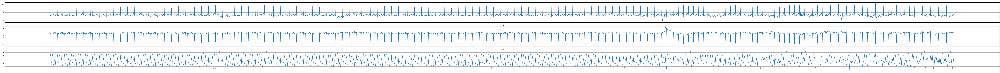

In [ ]:
registro_indice = 0
print("Dimensiones de las señales después del procesamiento:", all_data_h5_PRO_COMB_1[registro_indice].shape)

all_data_h5_PRO_COMB_1[registro_indice]


nombre_registro = sorted_file_list_h5[registro_indice]
signals = all_data_h5_PRO_COMB_1[registro_indice]
tiempo = np.arange(0, len(signals[0])) / 250.0

# Grafica cada señal
plt.figure(figsize=(200,15))
plt.suptitle("Registro: " + nombre_registro)

# Señal 1
plt.subplot(3, 1, 1)
plt.plot(tiempo, signals[0])
plt.title("Señal 1")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)

# Señal 2
plt.subplot(3, 1, 2)
plt.plot(tiempo, signals[1])
plt.title("Señal 2")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)

# Señal 3
plt.subplot(3, 1, 3)
plt.plot(tiempo, signals[2])
plt.title("Señal 3")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)


plt.tight_layout()

plt.show()


Combinación 3

Dimensiones de las señales después del procesamiento: (2, 75000)


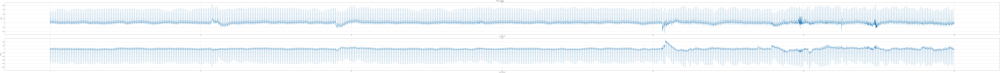

In [ ]:
registro_indice = 0
print("Dimensiones de las señales después del procesamiento:", all_data_h5_PRO_COMB_3[registro_indice].shape)

all_data_h5_PRO_COMB_3[registro_indice]


nombre_registro = sorted_file_list_h5[registro_indice]
signals = all_data_h5_PRO_COMB_3[registro_indice]
tiempo = np.arange(0, len(signals[0])) / 250.0

# Grafica cada señal
plt.figure(figsize=(200,15))
plt.suptitle("Registro: " + nombre_registro)

# Señal 1
plt.subplot(2, 1, 1)
plt.plot(tiempo, signals[0])
plt.title("Señal 1")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)

# Señal 2
plt.subplot(2, 1, 2)
plt.plot(tiempo, signals[1])
plt.title("Señal 2")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)


plt.tight_layout()

plt.show()


##NORMALIZACIÓN DE LAS SEÑALES

En esta sección, el objetivo primordial consiste en normalizar las señales con la normalización estandar o *z-score*, conforme se describe en la siguiente fórmula:  

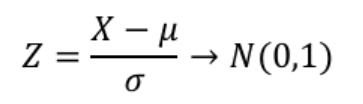

En situaciones donde se encontraban señales constantes, en cualquier posición de los tres registros, la evaluación de la fórmula resultaba en un valor NaN. Ante esta circunstancia, se optó por preservar la señal constante en 0.

In [ ]:
def normalize_signals(signals):
    # Calcular la media y la desviación estándar de cada señal
    mean = np.mean(signals, axis=1, keepdims=True)
    std = np.std(signals, axis=1, keepdims=True)

    # Encontrar señales que son completamente cero o tienen desviación estándar cero
    zero_signals = np.all(signals == 0, axis=1, keepdims=True)
    zero_std_signals = (std == 0)

    # Dejar en cero las señales con desviación estándar cero
    signals_with_zero_std = np.where(zero_std_signals, 0, signals)

    # Realizar la normalización Z-score independiente para señales que no son constantes
    normalized_signals = np.where(zero_signals | zero_std_signals, signals_with_zero_std, (signals_with_zero_std - mean) / std)

    return normalized_signals

In [ ]:
# Aplicar la normalización a todas las señales en all_data_H5 TODOS LOS DATOS
for index, signals in enumerate(all_data_h5_ALL):
    all_data_h5_ALL[index] = normalize_signals(signals)


<ipython-input-13-3752ae45e5a7>:14: RuntimeWarning: invalid value encountered in divide
  normalized_signals = np.where(zero_signals | zero_std_signals, signals_with_zero_std, (signals_with_zero_std - mean) / std)
<ipython-input-13-3752ae45e5a7>:14: RuntimeWarning: divide by zero encountered in divide
  normalized_signals = np.where(zero_signals | zero_std_signals, signals_with_zero_std, (signals_with_zero_std - mean) / std)


In [ ]:
# Aplicar la normalización a todas las señales en all_data, combinación 1
for index, signals in enumerate(all_data_h5_PRO_COMB_1):
    all_data_h5_PRO_COMB_1[index] = normalize_signals(signals)


<ipython-input-34-3752ae45e5a7>:14: RuntimeWarning: invalid value encountered in divide
  normalized_signals = np.where(zero_signals | zero_std_signals, signals_with_zero_std, (signals_with_zero_std - mean) / std)
<ipython-input-34-3752ae45e5a7>:14: RuntimeWarning: divide by zero encountered in divide
  normalized_signals = np.where(zero_signals | zero_std_signals, signals_with_zero_std, (signals_with_zero_std - mean) / std)


In [ ]:
# Aplicar la normalización a todas las señales en all_data, combinación 3
for index, signals in enumerate(all_data_h5_PRO_COMB_3):
    all_data_h5_PRO_COMB_3[index] = normalize_signals(signals)


<ipython-input-13-3752ae45e5a7>:14: RuntimeWarning: invalid value encountered in divide
  normalized_signals = np.where(zero_signals | zero_std_signals, signals_with_zero_std, (signals_with_zero_std - mean) / std)


In [ ]:
# Aplicar la normalización a todas las señales en all_data, combinación 5
for index, signals in enumerate(all_data_h5_PRO_COMB_5):
    all_data_h5_PRO_COMB_5[index] = normalize_signals(signals)


<ipython-input-34-3752ae45e5a7>:14: RuntimeWarning: invalid value encountered in divide
  normalized_signals = np.where(zero_signals | zero_std_signals, signals_with_zero_std, (signals_with_zero_std - mean) / std)
<ipython-input-34-3752ae45e5a7>:14: RuntimeWarning: divide by zero encountered in divide
  normalized_signals = np.where(zero_signals | zero_std_signals, signals_with_zero_std, (signals_with_zero_std - mean) / std)


Dimensiones de las señales después de la normalización:  (3, 75000)


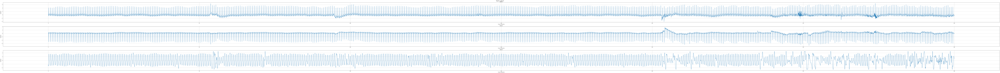

In [ ]:
# Prueba de Visualización de una señal normalizada para el mismo registro v100s, de la combinación 1

registro_indice = 0
print("Dimensiones de las señales después de la normalización: ", all_data_h5_PRO_COMB_1[registro_indice].shape)

all_data_h5_PRO_COMB_1[registro_indice]


nombre_registro = sorted_file_list_h5[registro_indice]
signals = all_data_h5_PRO_COMB_1[registro_indice]
tiempo = np.arange(0, len(signals[0])) / 250.0

# Grafica cada señal
plt.figure(figsize=(200,15))
plt.suptitle("Registro: " + nombre_registro)

# Señal 1
plt.subplot(3, 1, 1)
plt.plot(tiempo, signals[0])
plt.title("Señal 1")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)

# Señal 2
plt.subplot(3, 1, 2)
plt.plot(tiempo, signals[1])
plt.title("Señal 2")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)

# Señal 3
plt.subplot(3, 1, 3)
plt.plot(tiempo, signals[2])
plt.title("Señal 3")
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)


plt.tight_layout()

plt.show()


----------------------------------------------
#SUBDIVISIÓN DE DATOS PARA **ENTRENAMIENTO Y TESTEO**
----------------------------------------------


Además, el conjunto de datos incorpora un archivo denominado ALARMS, el cual almacena las etiquetas correspondientes a cada registro, identificando el tipo de arritmia que representa, así como indicando si la alarma asociada es falsa o verdadera. Las siguientes líneas de código fueron desarrolladas para extraer y almacenar todas estas características con el propósito de facilitar el proceso de entrenamiento. Siendo un ejemplo de una línea dentro de este archivo .TXT:


*   v100s,Ventricular_Tachycardia,0




In [ ]:
#Cargando el archivo ALARM
file_path_ALARM = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/Señales normales/Archivos Importantes/ALARMS"

Extraigo los labes específicos para la combinación deseada, recordemos que se guarda

*   Variable (registros_con_combinacion_N) donde N es tipo de combinación.

 Para este caso se trabajó con los labels específicos de la combinación 1.

Para todo el dato

In [ ]:
# Inicializar un diccionario para almacenar las etiquetas binarias directamente con el nombre del registro como clave
label_dict_ALL = {}

# Leer el archivo de alarmas
with open(file_path_ALARM, 'r') as file:
    lines = file.readlines()
    for line in lines:
        parts = line.strip().split(',')
        signal_name = parts[0]  # Nombre de la señal sin .mat

        # Verificar si el nombre de la señal está en la lista de todos los registros procesados
        matching_record = next((record for record in all_sig_names if record["record_name"] == signal_name), None)
        if matching_record is not None:
            label = int(parts[2])  # Etiqueta binaria (0 o 1)
            label_dict_ALL[matching_record["record_name"]] = label

# Verificar el resultado
print("Diccionario de etiquetas binarias:")
print(label_dict_ALL)


Diccionario de etiquetas binarias:
{'v100s': 0, 'v101l': 0, 'v102s': 0, 'a103l': 0, 'a104s': 0, 'a105l': 0, 't106s': 1, 't107l': 1, 't108s': 1, 'a109l': 0, 't110s': 1, 'v111l': 0, 't112s': 1, 'v113l': 0, 't114s': 1, 'v115l': 0, 't116s': 0, 't117l': 1, 't118s': 1, 'v119l': 0, 'f120s': 0, 'f121l': 0, 'v122s': 0, 'a123l': 0, 'b124s': 1, 'b125l': 1, 'b126s': 1, 'v127l': 0, 'v128s': 0, 'f129l': 0, 'f130s': 0, 'v131l': 1, 'v132s': 1, 'v133l': 1, 'a134s': 0, 'v135l': 0, 'v136s': 0, 'f137l': 0, 'f138s': 0, 'v139l': 1, 'v140s': 0, 'v141l': 0, 'a142s': 1, 'v143l': 1, 'f144s': 0, 'a145l': 0, 'v146s': 0, 'v147l': 0, 'v148s': 0, 't149l': 1, 't150s': 1, 't151l': 1, 'a152s': 0, 'v153l': 0, 'v154s': 0, 'v155l': 0, 't156s': 1, 't157l': 1, 'v158s': 1, 'v159l': 1, 'v160s': 0, 'a161l': 1, 'v162s': 0, 'a163l': 0, 'v164s': 0, 'a165l': 0, 'v166s': 0, 'a167l': 1, 'v168s': 0, 'v169l': 0, 'a170s': 0, 'a171l': 0, 'a172s': 1, 't173l': 1, 't174s': 1, 't175l': 1, 'v176s': 0, 'v177l': 0, 'a178s': 0, 'v179l': 0, 'v18

In [ ]:
print("Total de labels con la combinación deseada:", len(label_dict_ALL))

Total de labels con la combinación deseada: 750


In [ ]:
# Crear un diccionario para mapear nombres de señales a etiquetas binarias (0 o 1)
label_dict_1 = {}

# Crear un diccionario para mapear nombres de señales a etiquetas de arritmia
arrhythmia_label_dict_1 = {}

# Inicializar listas para almacenar las etiquetas de tipo de arritmia y las etiquetas binarias (0 o 1)
arrhythmia_labels_1 = []
binary_labels_1 = []

# Leer el archivo de alarmas
with open(file_path_ALARM, 'r') as file:
    lines = file.readlines()
    for line in lines:
        parts = line.strip().split(',')
        signal_name = parts[0]  # Nombre de la señal sin .mat

        # Verificar si el nombre de la señal está en la lista de registros específicos
        if signal_name in registros_con_combinacion_1:  #MODIFICAR SI SE DESEA CON OTRA COMBINACIÓN
            arrhythmia = parts[1]  # Tipo de arritmia
            label = int(parts[2])  # Etiqueta binaria (0 o 1)
            label_dict_1[signal_name] = label
            arrhythmia_labels_1.append(arrhythmia)
            binary_labels_1.append(label)
            arrhythmia_label_dict_1[signal_name] = arrhythmia

# Convertir las listas a arreglos NumPy si es necesario
arrhythmia_labels_1 = np.array(arrhythmia_labels_1)
binary_labels_1 = np.array(binary_labels_1)

# Verificar los resultados
print("Diccionario de etiquetas binarias:")
print(label_dict_1)

#print("\nDiccionario de etiquetas de arritmia:")
#print(arrhythmia_label_dict_1)

#print("\nEtiquetas de tipo de arritmia:")
#print(arrhythmia_labels_1)

#print("\nEtiquetas binarias:")
#print(binary_labels_1)

Diccionario de etiquetas binarias:
{'v100s': 0, 'v101l': 0, 'v102s': 0, 'a103l': 0, 'a104s': 0, 'a105l': 0, 't112s': 1, 'v113l': 0, 't114s': 1, 'v115l': 0, 't117l': 1, 't118s': 1, 'v119l': 0, 'f120s': 0, 'f121l': 0, 'v122s': 0, 'a123l': 0, 'b124s': 1, 'b125l': 1, 'b126s': 1, 'v127l': 0, 'v128s': 0, 'f129l': 0, 'f130s': 0, 'v132s': 1, 'a134s': 0, 'v135l': 0, 'v136s': 0, 'f137l': 0, 'f138s': 0, 'v139l': 1, 'v140s': 0, 'v141l': 0, 'a142s': 1, 'v143l': 1, 'f144s': 0, 'a145l': 0, 'v146s': 0, 'v147l': 0, 'v148s': 0, 't149l': 1, 't150s': 1, 't151l': 1, 'a152s': 0, 'v153l': 0, 'v154s': 0, 'v155l': 0, 't156s': 1, 't157l': 1, 'v158s': 1, 'v159l': 1, 'v160s': 0, 'a161l': 1, 'v162s': 0, 'a163l': 0, 'v164s': 0, 'a165l': 0, 'v166s': 0, 'a167l': 1, 'v168s': 0, 'v169l': 0, 'a170s': 0, 'a171l': 0, 'a172s': 1, 't173l': 1, 't174s': 1, 't175l': 1, 'v176s': 0, 'a178s': 0, 'v179l': 0, 'v180s': 0, 'v181l': 0, 'v182s': 0, 'b183l': 1, 'b184s': 0, 'a185l': 1, 'a186s': 0, 'b187l': 1, 'v188s': 1, 'f189l': 0, 'f19

In [ ]:
print("Total de labels con la combinación deseada:", len(label_dict_1))

Total de labels con la combinación deseada: 572


 Para este caso se trabajó con los labels específicos de la combinación 3.

In [ ]:
# Crear un diccionario para mapear nombres de señales a etiquetas binarias (0 o 1)
label_dict_3 = {}

# Crear un diccionario para mapear nombres de señales a etiquetas de arritmia
arrhythmia_label_dict_3 = {}

# Inicializar listas para almacenar las etiquetas de tipo de arritmia y las etiquetas binarias (0 o 1)
arrhythmia_labels_3 = []
binary_labels_3 = []

# Leer el archivo de alarmas
with open(file_path_ALARM, 'r') as file:
    lines = file.readlines()
    for line in lines:
        parts = line.strip().split(',')
        signal_name = parts[0]  # Nombre de la señal sin .mat

        # Verificar si el nombre de la señal está en la lista de registros específicos
        if signal_name in registros_con_combinacion_3:  #MODIFICAR SI SE DESEA CON OTRA COMBINACIÓN
            arrhythmia = parts[1]  # Tipo de arritmia
            label = int(parts[2])  # Etiqueta binaria (0 o 1)
            label_dict_3[signal_name] = label
            arrhythmia_labels_3.append(arrhythmia)
            binary_labels_3.append(label)
            arrhythmia_label_dict_3[signal_name] = arrhythmia

# Convertir las listas a arreglos NumPy si es necesario
arrhythmia_labels_3 = np.array(arrhythmia_labels_3)
binary_labels_3 = np.array(binary_labels_3)

# Verificar los resultados
print("Diccionario de etiquetas binarias:")
print(label_dict_3)

#print("\nDiccionario de etiquetas de arritmia:")
#print(arrhythmia_label_dict_1)

#print("\nEtiquetas de tipo de arritmia:")
#print(arrhythmia_labels_1)

#print("\nEtiquetas binarias:")
#print(binary_labels_1)

Diccionario de etiquetas binarias:
{'v100s': 0, 'v101l': 0, 'v102s': 0, 'a103l': 0, 'a104s': 0, 'a105l': 0, 't110s': 1, 't112s': 1, 'v113l': 0, 't114s': 1, 'v115l': 0, 't117l': 1, 't118s': 1, 'v119l': 0, 'f120s': 0, 'f121l': 0, 'v122s': 0, 'a123l': 0, 'b124s': 1, 'b125l': 1, 'b126s': 1, 'v127l': 0, 'v128s': 0, 'f129l': 0, 'f130s': 0, 'v131l': 1, 'v132s': 1, 'a134s': 0, 'v135l': 0, 'v136s': 0, 'f137l': 0, 'f138s': 0, 'v139l': 1, 'v140s': 0, 'v141l': 0, 'a142s': 1, 'v143l': 1, 'f144s': 0, 'a145l': 0, 'v146s': 0, 'v147l': 0, 'v148s': 0, 't149l': 1, 't150s': 1, 't151l': 1, 'a152s': 0, 'v153l': 0, 'v154s': 0, 'v155l': 0, 't156s': 1, 't157l': 1, 'v158s': 1, 'v159l': 1, 'v160s': 0, 'a161l': 1, 'v162s': 0, 'a163l': 0, 'v164s': 0, 'a165l': 0, 'v166s': 0, 'a167l': 1, 'v168s': 0, 'v169l': 0, 'a170s': 0, 'a171l': 0, 'a172s': 1, 't173l': 1, 't174s': 1, 't175l': 1, 'v176s': 0, 'a178s': 0, 'v179l': 0, 'v180s': 0, 'v181l': 0, 'v182s': 0, 'b183l': 1, 'b184s': 0, 'a185l': 1, 'a186s': 0, 'b187l': 1, 'v18

In [ ]:
print("Total de labels con la combinación deseada:", len(label_dict_3))

Total de labels con la combinación deseada: 668


 Para este caso se trabajó con los labels específicos de la combinación 5.

In [ ]:
# Crear un diccionario para mapear nombres de señales a etiquetas binarias (0 o 1)
label_dict_5 = {}

# Crear un diccionario para mapear nombres de señales a etiquetas de arritmia
arrhythmia_label_dict_5 = {}

# Inicializar listas para almacenar las etiquetas de tipo de arritmia y las etiquetas binarias (0 o 1)
arrhythmia_labels_5 = []
binary_labels_5 = []

# Leer el archivo de alarmas
with open(file_path_ALARM, 'r') as file:
    lines = file.readlines()
    for line in lines:
        parts = line.strip().split(',')
        signal_name = parts[0]  # Nombre de la señal sin .mat

        # Verificar si el nombre de la señal está en la lista de registros específicos
        if signal_name in registros_con_combinacion_5:  #MODIFICAR SI SE DESEA CON OTRA COMBINACIÓN
            arrhythmia = parts[1]  # Tipo de arritmia
            label = int(parts[2])  # Etiqueta binaria (0 o 1)
            label_dict_5[signal_name] = label
            arrhythmia_labels_5.append(arrhythmia)
            binary_labels_5.append(label)
            arrhythmia_label_dict_5[signal_name] = arrhythmia

# Convertir las listas a arreglos NumPy si es necesario
arrhythmia_labels_5 = np.array(arrhythmia_labels_5)
binary_labels_5 = np.array(binary_labels_5)

# Verificar los resultados
print("Diccionario de etiquetas binarias:")
print(label_dict_5)

#print("\nDiccionario de etiquetas de arritmia:")
#print(arrhythmia_label_dict_1)

#print("\nEtiquetas de tipo de arritmia:")
#print(arrhythmia_labels_1)

#print("\nEtiquetas binarias:")
#print(binary_labels_1)

Diccionario de etiquetas binarias:
{'t110s': 1, 'v115l': 0, 'v119l': 0, 'f120s': 0, 'f121l': 0, 'v122s': 0, 'a123l': 0, 'f129l': 0, 'f130s': 0, 'v131l': 1, 'a134s': 0, 'v135l': 0, 'v136s': 0, 'v140s': 0, 'v141l': 0, 'a142s': 1, 'v147l': 0, 'v148s': 0, 'v154s': 0, 'v160s': 0, 'v162s': 0, 'v166s': 0, 'a167l': 1, 'v168s': 0, 'v169l': 0, 'a170s': 0, 'a171l': 0, 'a172s': 1, 't173l': 1, 't174s': 1, 't175l': 1, 'v176s': 0, 'a178s': 0, 'v179l': 0, 'v180s': 0, 'v181l': 0, 'v182s': 0, 'f196s': 0, 'v197l': 1, 'v200s': 0, 'v201l': 0, 'v202s': 0, 'v205l': 0, 't213l': 1, 't214s': 1, 'b215l': 0, 'b216s': 0, 'v217l': 0, 'v218s': 0, 'v221l': 1, 'v222s': 0, 'v224s': 0, 'v230s': 0, 'b231l': 0, 'v232s': 0, 'v233l': 0, 'f236s': 0, 'f237l': 0, 'v241l': 0, 'v246s': 0, 'v247l': 0, 'v248s': 0, 't249l': 1, 't251l': 1, 't252s': 1, 'v253l': 1, 'v254s': 1, 'v255l': 1, 'b268s': 1, 'a272s': 0, 'a273l': 0, 't276s': 1, 't277l': 1, 'v283l': 0, 't284s': 1, 'b285l': 0, 'b286s': 0, 'a287l': 0, 'a288s': 0, 'v291l': 0, 'v29

In [ ]:
print("Total de labels con la combinación deseada:", len(label_dict_5))

Total de labels con la combinación deseada: 309


###Tablas para saber la cantidad de etiquetas por tipo de combinación

In [ ]:
# Convertir el diccionario a listas para adaptarse a tu código original
binary_labels_CUADRO_0 = list(label_dict_ALL.values())
arrhythmia_labels_CUADRO_0 = []  # Reemplaza con tus propias etiquetas de arritmia si las tienes

# Contar la cantidad de 0 y 1
count_CUADRO_0_0 = np.sum(np.array(binary_labels_CUADRO_0) == 0)
count_CUADRO_0_1 = np.sum(np.array(binary_labels_CUADRO_0) == 1)

# Crear un DataFrame
data_CUADRO_0 = {'Etiqueta binaria': ["Falso", "Verdadero"], 'Cantidad': [count_CUADRO_0_0, count_CUADRO_0_1]}
df_CUADRO_0 = pd.DataFrame(data_CUADRO_0)

# Mostrar la tabla
print(df_CUADRO_0)

  Etiqueta binaria  Cantidad
0            Falso       456
1        Verdadero       294


Para la combinación 1

In [ ]:
arrhythmia_labels_CUADRO_1 = np.array(arrhythmia_labels_1)
binary_labels_CUADRO_1 = np.array(binary_labels_1)

# Contar la cantidad de 0 y 1
count1_0 = np.sum(binary_labels_1 == 0)
count1_1 = np.sum(binary_labels_1 == 1)

# Crear un DataFrame
data_1 = {'Etiqueta binaria': ["Falso", "Verdadero"], 'Cantidad': [count1_0, count1_1]}
df_1 = pd.DataFrame(data_1)

# Mostrar la tabla
print(df_1)

  Etiqueta binaria  Cantidad
0            Falso       370
1        Verdadero       202


Para la combinación 3

In [ ]:
arrhythmia_labels_CUADRO_3 = np.array(arrhythmia_labels_3)
binary_labels_CUADRO_3 = np.array(binary_labels_3)

# Contar la cantidad de 0 y 1
count3_0 = np.sum(binary_labels_3 == 0)
count3_1 = np.sum(binary_labels_3 == 1)

# Crear un DataFrame
data_3 = {'Etiqueta binaria': ["Falso", "Verdadero"], 'Cantidad': [count3_0, count3_1]}
df_3 = pd.DataFrame(data_3)

# Mostrar la tabla
print(df_3)

  Etiqueta binaria  Cantidad
0            Falso       414
1        Verdadero       254


Para la combinación 5

In [ ]:
arrhythmia_labels_CUADRO_5 = np.array(arrhythmia_labels_5)
binary_labels_CUADRO_5 = np.array(binary_labels_5)

# Contar la cantidad de 0 y 1
count5_0 = np.sum(binary_labels_5 == 0)
count5_1 = np.sum(binary_labels_5 == 1)

# Crear un DataFrame
data_5 = {'Etiqueta binaria': ["Falso", "Verdadero"], 'Cantidad': [count5_0, count5_1]}
df_5 = pd.DataFrame(data_5)

# Mostrar la tabla
print(df_5)

  Etiqueta binaria  Cantidad
0            Falso       209
1        Verdadero       100


###Codigo para dividir los nombres de las señales para entrenamiento, testeo y validación

In [ ]:
# Obtener los nombres de las señales procesadas
signal_names_ALL = [os.path.splitext(os.path.basename(file))[0] for file in sorted_file_paths_h5]

# Filtrar solo los nombres de señales procesados
processed_signal_names_ALL = [name for name in signal_names_ALL if name in signal_names_ALL]

# Dividir los nombres de las señales procesadas en conjuntos de entrenamiento, validación y prueba
train_names_ALL, temp_names = train_test_split(processed_signal_names_ALL, test_size=0.2, random_state=42)
val_names_ALL, test_names_ALL = train_test_split(temp_names, test_size=0.5, random_state=42)

# Imprimir nombres de las señales de entrenamiento, validación y prueba
print("Nombres de señales de entrenamiento:")
print(train_names_ALL)
print("\nNombres de señales de validación:")
print(val_names_ALL)
print("\nNombres de señales de prueba:")
print(test_names_ALL)

Nombres de señales de entrenamiento:
['b695l', 'b231l', 'f144s', 'a170s', 'v772s', 'b308s', 't444s', 'a723l', 't235l', 'v581l', 'v128s', 'v564s', 'v498s', 'v729l', 'f236s', 't595l', 't106s', 'v711l', 't173l', 'v298s', 'b299l', 'v245l', 'v423l', 'v844s', 'v232s', 'v426s', 'a715l', 't801l', 'v141l', 't208s', 'v632s', 't156s', 'v292s', 't683l', 'b456s', 'v701l', 't477l', 'b124s', 'f657l', 't580s', 'v551l', 'v432s', 'v830s', 'v210s', 'v182s', 't151l', 't520s', 't702s', 't622s', 'f697l', 'v726s', 'a490s', 'a239l', 'v767l', 'v536s', 't118s', 't731l', 't240s', 'a446s', 'v607l', 'b183l', 'a161l', 'v721l', 'f545l', 'f129l', 'a631l', 'b331l', 'f450s', 'v392s', 'v831l', 'v282s', 'b669l', 'v364s', 'v848s', 'v323l', 'v482s', 't507l', 't335l', 'a556s', 'v309l', 'b488s', 'f529l', 't276s', 't787l', 'f414s', 'v375l', 'v648s', 'v460s', 'f237l', 't707l', 'a802s', 'b764s', 't263l', 'v438s', 'v759l', 't174s', 'v431l', 'v686s', 't344s', 'v427l', 'b451l', 'a582s', 'v204s', 't214s', 'v774s', 't394s', 't689l',

In [ ]:
print("Cantidad de datos de Entrenamiento:", len(train_names_ALL))
print("Cantidad de datos de Validación:", len(val_names_ALL))
print("Cantidad de datos de Testeo:", len(test_names_ALL))

Cantidad de datos de Entrenamiento: 600
Cantidad de datos de Validación: 75
Cantidad de datos de Testeo: 75


In [ ]:
# Obtener las etiquetas binarias para las señales de entrenamiento, validación y prueba
train_labels_ALL = [label_dict_ALL[name] for name in train_names_ALL]
val_labels_ALL = [label_dict_ALL[name] for name in val_names_ALL]
test_labels_ALL = [label_dict_ALL[name] for name in test_names_ALL]

# Contar la cantidad de 0 y 1 para cada conjunto
count_train_ALL_0 = np.sum(np.array(train_labels_ALL) == 0)
count_train_ALL_1 = np.sum(np.array(train_labels_ALL) == 1)

count_val_ALL_0 = np.sum(np.array(val_labels_ALL) == 0)
count_val_ALL_1 = np.sum(np.array(val_labels_ALL) == 1)

count_test_ALL_0 = np.sum(np.array(test_labels_ALL) == 0)
count_test_ALL_1 = np.sum(np.array(test_labels_ALL) == 1)

# Crear un DataFrame
data_split_ALL = {'Conjunto': ['Entrenamiento', 'Validación', 'Testeo'],
                 'Falsas Alarmas (0)': [count_train_ALL_0, count_val_ALL_0, count_test_ALL_0],
                 'Verdaderas Alarmas (1)': [count_train_ALL_1, count_val_ALL_1, count_test_ALL_1]}

df_split_ALL = pd.DataFrame(data_split_ALL)

# Mostrar la tabla
display(df_split_ALL)

,Conjunto,Falsas Alarmas (0),Verdaderas Alarmas (1)
0,Entrenamiento,358,242
1,Validación,52,23
2,Testeo,46,29


Con esta sección de código, se divide los nombres de las señales que tengan la combinación deseada (en este caso la 1)

In [ ]:
# Obtener los nombres de las señales procesadas
signal_names_1 = [os.path.splitext(os.path.basename(file))[0] for file in sorted_file_paths_h5]

# Filtrar solo los nombres de señales procesados
processed_signal_names_1 = [name for name in signal_names_1 if name in registros_con_combinacion_1] #editar si se desea otra combinación como se indicó

# Dividir los nombres de las señales procesadas en conjuntos de entrenamiento, validación y prueba
train_names_1, temp_names = train_test_split(processed_signal_names_1, test_size=0.2, random_state=42)
val_names_1, test_names_1 = train_test_split(temp_names, test_size=0.5, random_state=42)

# Imprimir nombres de las señales de entrenamiento, validación y prueba
print("Nombres de señales de entrenamiento:")
print(train_names_1)
print("\nNombres de señales de validación:")
print(val_names_1)
print("\nNombres de señales de prueba:")
print(test_names_1)


Nombres de señales de entrenamiento:
['v322s', 'a172s', 'v292s', 'v169l', 'v122s', 'f543l', 'v258s', 't717l', 'v641l', 'v202s', 't678s', 't238s', 'b528s', 'a550s', 'a142s', 'v100s', 'b835l', 'v471l', 't786s', 'v361l', 'f129l', 'v597l', 'v403l', 'a203l', 'f613l', 'v319l', 'b125l', 'v426s', 't458s', 'b265l', 'v766s', 'v400s', 'v727l', 'v788s', 'v325l', 'f545l', 'a163l', 'v492s', 'v155l', 'v207l', 'a555l', 'b227l', 'v402s', 'b849l', 'v649l', 't589l', 'f362s', 'v575l', 'a606s', 'v541l', 'v775l', 'v640s', 'v179l', 't410s', 'a315l', 'f586s', 'v620s', 'a273l', 'v245l', 'v633l', 'b341l', 'v423l', 't662s', 'b669l', 'f618s', 'v510s', 'v781l', 'f829l', 'v233l', 'v262s', 't821l', 'v113l', 'v713l', 'b126s', 'a310s', 'f610s', 'a165l', 'v437l', 'v569l', 'v818s', 'v513l', 't447l', 'v158s', 'a694s', 'a134s', 'b600s', 'v489l', 't744s', 't151l', 'b560s', 'v381l', 'v804s', 'v733l', 'a527l', 'v280s', 'v247l', 'a446s', 'v809l', 'a603l', 'v312s', 'v140s', 'v232s', 'a819l', 'a311l', 'v452s', 'a378s', 'v166s',

In [ ]:
print("Cantidad de datos de Entrenamiento:", len(train_names_1))
print("Cantidad de datos de Validación:", len(val_names_1))
print("Cantidad de datos de Testeo:", len(test_names_1))

Cantidad de datos de Entrenamiento: 457
Cantidad de datos de Validación: 57
Cantidad de datos de Testeo: 58


In [ ]:
# Obtener las etiquetas binarias para las señales de entrenamiento, validación y prueba
train_labels_1 = [label_dict_1[name] for name in train_names_1]
val_labels_1 = [label_dict_1[name] for name in val_names_1]
test_labels_1 = [label_dict_1[name] for name in test_names_1]

# Contar la cantidad de 0 y 1 para cada conjunto
count_train1_0 = np.sum(np.array(train_labels_1) == 0)
count_train1_1 = np.sum(np.array(train_labels_1) == 1)

count_val1_0 = np.sum(np.array(val_labels_1) == 0)
count_val1_1 = np.sum(np.array(val_labels_1) == 1)

count_test1_0 = np.sum(np.array(test_labels_1) == 0)
count_test1_1 = np.sum(np.array(test_labels_1) == 1)

# Crear un DataFrame
data_split_1 = {'Conjunto': ['Entrenamiento', 'Validación', 'Testeo'],
              'Falsas Alarmas (0)': [count_train1_0, count_val1_0, count_test1_0],
              'Verdaderas Alarmas (1)': [count_train1_1, count_val1_1, count_test1_1]}

df_split_1 = pd.DataFrame(data_split_1)

# Mostrar la tabla
display(df_split_1)

,Conjunto,Falsas Alarmas (0),Verdaderas Alarmas (1)
0,Entrenamiento,301,156
1,Validación,36,21
2,Testeo,33,25


Con esta sección de código, se divide los nombres de las señales que tengan la combinación deseada (en este caso la 3)

In [ ]:
# Obtener los nombres de las señales procesadas
signal_names_3 = [os.path.splitext(os.path.basename(file))[0] for file in sorted_file_paths_h5]

# Filtrar solo los nombres de señales procesados
processed_signal_names_3 = [name for name in signal_names_1 if name in registros_con_combinacion_3] #editar si se desea otra combinación como se indicó

# Dividir los nombres de las señales procesadas en conjuntos de entrenamiento, validación y prueba
train_names_3, temp_names = train_test_split(processed_signal_names_3, test_size=0.2, random_state=42)
val_names_3, test_names_3 = train_test_split(temp_names, test_size=0.5, random_state=42)

# Imprimir nombres de las señales de entrenamiento, validación y prueba
print("Nombres de señales de entrenamiento:")
print(train_names_3)
print("\nNombres de señales de validación:")
print(val_names_3)
print("\nNombres de señales de prueba:")
print(test_names_3)


Nombres de señales de entrenamiento:
['v361l', 'v536s', 'v775l', 'v168s', 'f260s', 'a490s', 'v136s', 'v280s', 'v454s', 'v337l', 'v828s', 'v541l', 'v293l', 't567l', 't716s', 'b588s', 'v475l', 'f691l', 'a778s', 'b331l', 't801l', 'v769l', 'b753l', 'v542s', 'v628s', 'v626s', 'v519l', 'b216s', 'b229l', 't771l', 'v525l', 'f610s', 't700s', 't112s', 'v199l', 'a653l', 'f493l', 'b734s', 'b486s', 'v476s', 'v360s', 'v255l', 't677l', 't150s', 't149l', 'v181l', 't284s', 'v353l', 'v748s', 't173l', 't117l', 'v758s', 'b706s', 'b685l', 'v374s', 'v470s', 'v464s', 'v402s', 'a527l', 'v296s', 'v559l', 'v548s', 't191l', 'v557l', 't467l', 'f563l', 'b187l', 'f129l', 'v375l', 'b494s', 't335l', 'b388s', 'a819l', 't424s', 'v399l', 't252s', 't418s', 'v140s', 'b340s', 'v373l', 't114s', 'v128s', 'f414s', 'v756s', 'v830s', 'v818s', 't192s', 't447l', 'v643l', 'v634s', 'b387l', 'v324s', 'a315l', 'v811l', 'a203l', 'v405l', 'v370s', 'v590s', 'v783l', 'v135l', 'v303l', 'a699l', 'v804s', 'a297l', 'a514s', 'b268s', 'b183l',

In [ ]:
print("Cantidad de datos de Entrenamiento:", len(train_names_3))
print("Cantidad de datos de Validación:", len(val_names_3))
print("Cantidad de datos de Testeo:", len(test_names_3))

Cantidad de datos de Entrenamiento: 534
Cantidad de datos de Validación: 67
Cantidad de datos de Testeo: 67


In [ ]:
# Obtener las etiquetas binarias para las señales de entrenamiento, validación y prueba
train_labels_3 = [label_dict_3[name] for name in train_names_3]
val_labels_3 = [label_dict_3[name] for name in val_names_3]
test_labels_3 = [label_dict_3[name] for name in test_names_3]

# Contar la cantidad de 0 y 1 para cada conjunto
count_train3_0 = np.sum(np.array(train_labels_3) == 0)
count_train3_1 = np.sum(np.array(train_labels_3) == 1)

count_val3_0 = np.sum(np.array(val_labels_3) == 0)
count_val3_1 = np.sum(np.array(val_labels_3) == 1)

count_test3_0 = np.sum(np.array(test_labels_3) == 0)
count_test3_1 = np.sum(np.array(test_labels_3) == 1)

# Crear un DataFrame
data_split_3 = {'Conjunto': ['Entrenamiento', 'Validación', 'Testeo'],
              'Falsas Alarmas (0)': [count_train3_0, count_val3_0, count_test3_0],
              'Verdaderas Alarmas (1)': [count_train3_1, count_val3_1, count_test3_1]}

df_split_3 = pd.DataFrame(data_split_3)

# Mostrar la tabla
display(df_split_3)

,Conjunto,Falsas Alarmas (0),Verdaderas Alarmas (1)
0,Entrenamiento,332,202
1,Validación,39,28
2,Testeo,43,24


Con esta sección de código, se divide los nombres de las señales que tengan la combinación deseada (en este caso la 5)

In [ ]:
# Obtener los nombres de las señales procesadas
signal_names_5 = [os.path.splitext(os.path.basename(file))[0] for file in sorted_file_paths_h5]

# Filtrar solo los nombres de señales procesados
processed_signal_names_5 = [name for name in signal_names_1 if name in registros_con_combinacion_5] #editar si se desea otra combinación como se indicó

# Dividir los nombres de las señales procesadas en conjuntos de entrenamiento, validación y prueba
train_names_5, temp_names = train_test_split(processed_signal_names_5, test_size=0.2, random_state=42)
val_names_5, test_names_5 = train_test_split(temp_names, test_size=0.5, random_state=42)

# Imprimir nombres de las señales de entrenamiento, validación y prueba
print("Nombres de señales de entrenamiento:")
print(train_names_5)
print("\nNombres de señales de validación:")
print(val_names_5)
print("\nNombres de señales de prueba:")
print(test_names_5)


Nombres de señales de entrenamiento:
['a382s', 'a345l', 'v663l', 'v620s', 'f544s', 'a288s', 't425l', 'v246s', 'a363l', 'a123l', 'b515l', 't175l', 'a167l', 't719l', 'f236s', 'v431l', 'f408s', 'v557l', 'b757l', 'f545l', 't417l', 'b484s', 'a311l', 'v579l', 'v254s', 'v361l', 'v491l', 't680s', 'v160s', 't424s', 'v291l', 'a822s', 'v793l', 't277l', 'a142s', 'a134s', 'v743l', 'v646s', 'v329l', 'b268s', 'v649l', 'f196s', 'v147l', 'v233l', 'a461l', 'v758s', 'v255l', 'v347l', 'a272s', 'v176s', 'b516s', 'v464s', 'a639l', 'v374s', 'v154s', 'b706s', 'v325l', 'f407l', 'v390s', 'v298s', 't709l', 'b456s', 'v381l', 'v718s', 'v551l', 'b835l', 'v811l', 'b494s', 'f530s', 'v571l', 'v808s', 'b387l', 'v197l', 'v660s', 't496s', 't413l', 'f352s', 'b495l', 'f362s', 'v779l', 'v759l', 'b659l', 'v518s', 'v615l', 'v119l', 'v360s', 'v531l', 'v519l', 'v365l', 'b578s', 'v724s', 't383l', 't284s', 't174s', 'v295l', 'f697l', 'b339l', 'v803l', 'v482s', 'v392s', 'a776s', 'v596s', 'v253l', 'a558s', 'a297l', 'v585l', 'v466s',

In [ ]:
print("Cantidad de datos de Entrenamiento:", len(train_names_5))
print("Cantidad de datos de Validación:", len(val_names_5))
print("Cantidad de datos de Testeo:", len(test_names_5))

Cantidad de datos de Entrenamiento: 247
Cantidad de datos de Validación: 31
Cantidad de datos de Testeo: 31


In [ ]:
# Obtener las etiquetas binarias para las señales de entrenamiento, validación y prueba
train_labels_5 = [label_dict_5[name] for name in train_names_5]
val_labels_5 = [label_dict_5[name] for name in val_names_5]
test_labels_5 = [label_dict_5[name] for name in test_names_5]

# Contar la cantidad de 0 y 1 para cada conjunto
count_train5_0 = np.sum(np.array(train_labels_5) == 0)
count_train5_1 = np.sum(np.array(train_labels_5) == 1)

count_val5_0 = np.sum(np.array(val_labels_5) == 0)
count_val5_1 = np.sum(np.array(val_labels_5) == 1)

count_test5_0 = np.sum(np.array(test_labels_5) == 0)
count_test5_1 = np.sum(np.array(test_labels_5) == 1)

# Crear un DataFrame
data_split_5 = {'Conjunto': ['Entrenamiento', 'Validación', 'Testeo'],
              'Falsas Alarmas (0)': [count_train5_0, count_val5_0, count_test5_0],
              'Verdaderas Alarmas (1)': [count_train5_1, count_val5_1, count_test5_1]}

df_split_5 = pd.DataFrame(data_split_5)

# Mostrar la tabla
display(df_split_5)

,Conjunto,Falsas Alarmas (0),Verdaderas Alarmas (1)
0,Entrenamiento,162,85
1,Validación,24,7
2,Testeo,23,8


###Subdivisión para el testo de los modelos!

Creo un diccionario para almacenar el nombre y el comentario de las señales de TESTING. Todo esto en aras de probar los resultados del modelo entrenado, para el caso: 1

In [ ]:
# Crear un diccionario para almacenar nombre y comentario de las señales de testing
testing_comments_dict_1 = {}

# Filtrar comments_combinacion_1 para obtener solo las señales de testing y sus comentarios
for record_name, record_comments in comments_combinacion_1.items():
    if record_name in test_names_1:
        # Conservar solo el nombre y la primera entrada de la lista de comentarios
        testing_comments_dict_1[record_name] = [record_comments[0]]

# Crear un diccionario ordenado que conserve el orden original
ordered_testing_comments_dict_1 = {key: testing_comments_dict_1[key] for key in test_names_1}

# Imprimir el diccionario con los nombres y comentarios de las señales de testing
print(ordered_testing_comments_dict_1)


{'v324s': ['Ventricular_Tachycardia'], 'a802s': ['Asystole'], 'b220s': ['Bradycardia'], 'f414s': ['Ventricular_Flutter_Fib'], 'v686s': ['Ventricular_Tachycardia'], 'b228s': ['Bradycardia'], 't509l': ['Tachycardia'], 'a239l': ['Asystole'], 'v828s': ['Ventricular_Tachycardia'], 'a443l': ['Asystole'], 'a645l': ['Asystole'], 't117l': ['Tachycardia'], 't357l': ['Tachycardia'], 'v774s': ['Ventricular_Tachycardia'], 'v217l': ['Ventricular_Tachycardia'], 'v759l': ['Ventricular_Tachycardia'], 't595l': ['Tachycardia'], 'v399l': ['Ventricular_Tachycardia'], 'v505l': ['Ventricular_Tachycardia'], 'a272s': ['Asystole'], 'b515l': ['Bradycardia'], 'v784s': ['Ventricular_Tachycardia'], 'f789l': ['Ventricular_Flutter_Fib'], 'v848s': ['Ventricular_Tachycardia'], 'v188s': ['Ventricular_Tachycardia'], 'a699l': ['Asystole'], 't344s': ['Tachycardia'], 'v590s': ['Ventricular_Tachycardia'], 't300s': ['Tachycardia'], 't800s': ['Tachycardia'], 'a266s': ['Asystole'], 't193l': ['Tachycardia'], 't468s': ['Tachycard

In [ ]:
print("El tamaño de los comentarios para la señales de Testing es: ", len(ordered_testing_comments_dict_1))

El tamaño de los comentarios para la señales de Testing es:  58


In [ ]:
archivo_txt = "testing_comments_dict1.txt"

# Guardar el diccionario en un archivo de texto
with open(archivo_txt, 'w') as file:
    for record_name, comments in ordered_testing_comments_dict_1.items():
        file.write(f"{comments}\n")

print(f"Se han guardado los nombres y comentarios de las señales de testing en {archivo_txt}")


Se han guardado los nombres y comentarios de las señales de testing en testing_comments_dict1.txt


Creo un diccionario para almacenar el nombre y el comentario de las señales de TESTING. Todo esto en aras de probar los resultados del modelo entrenado, para el caso: 3

In [ ]:
# Crear un diccionario para almacenar nombre y comentario de las señales de testing
testing_comments_dict_3 = {}

# Filtrar comments_combinacion_1 para obtener solo las señales de testing y sus comentarios
for record_name, record_comments in comments_combinacion_3.items():
    if record_name in test_names_3:
        # Conservar solo el nombre y la primera entrada de la lista de comentarios
        testing_comments_dict_3[record_name] = [record_comments[0]]

# Crear un diccionario ordenado que conserve el orden original
ordered_testing_comments_dict_3 = {key: testing_comments_dict_3[key] for key in test_names_3}

# Imprimir el diccionario con los nombres y comentarios de las señales de testing
print(ordered_testing_comments_dict_3)


{'v158s': ['Ventricular_Tachycardia'], 'f799l': ['Ventricular_Flutter_Fib'], 'b794s': ['Bradycardia'], 'a272s': ['Asystole'], 'f138s': ['Ventricular_Flutter_Fib'], 'f281l': ['Ventricular_Flutter_Fib'], 'v491l': ['Ventricular_Tachycardia'], 'b220s': ['Bradycardia'], 'f196s': ['Ventricular_Flutter_Fib'], 'f605l': ['Ventricular_Flutter_Fib'], 'v533l': ['Ventricular_Tachycardia'], 't741l': ['Tachycardia'], 'b839l': ['Bradycardia'], 'v233l': ['Ventricular_Tachycardia'], 'v611l': ['Ventricular_Tachycardia'], 'v714s': ['Ventricular_Tachycardia'], 'a172s': ['Asystole'], 'v403l': ['Ventricular_Tachycardia'], 'a624s': ['Asystole'], 'v466s': ['Ventricular_Tachycardia'], 'v788s': ['Ventricular_Tachycardia'], 't384s': ['Tachycardia'], 'a161l': ['Asystole'], 'v427l': ['Ventricular_Tachycardia'], 'f189l': ['Ventricular_Flutter_Fib'], 'v774s': ['Ventricular_Tachycardia'], 'v607l': ['Ventricular_Tachycardia'], 'v392s': ['Ventricular_Tachycardia'], 'v483l': ['Ventricular_Tachycardia'], 'v846s': ['Ventri

In [ ]:
print("El tamaño de los comentarios para la señales de Testing es: ", len(ordered_testing_comments_dict_3))

El tamaño de los comentarios para la señales de Testing es:  67


In [ ]:
archivo_txt = "testing_comments_dict3.txt"

# Guardar el diccionario en un archivo de texto
with open(archivo_txt, 'w') as file:
    for record_name, comments in ordered_testing_comments_dict_3.items():
        file.write(f"{comments}\n")

print(f"Se han guardado los nombres y comentarios de las señales de testing en {archivo_txt}")


Se han guardado los nombres y comentarios de las señales de testing en testing_comments_dict3.txt


Creo un diccionario para almacenar el nombre y el comentario de las señales de TESTING. Todo esto en aras de probar los resultados del modelo entrenado, para el caso: 5

In [ ]:
# Crear un diccionario para almacenar nombre y comentario de las señales de testing
testing_comments_dict_5 = {}

# Filtrar comments_combinacion_1 para obtener solo las señales de testing y sus comentarios
for record_name, record_comments in comments_combinacion_5.items():
    if record_name in test_names_5:
        # Conservar solo el nombre y la primera entrada de la lista de comentarios
        testing_comments_dict_5[record_name] = [record_comments[0]]

# Crear un diccionario ordenado que conserve el orden original
ordered_testing_comments_dict_5 = {key: testing_comments_dict_5[key] for key in test_names_5}

# Imprimir el diccionario con los nombres y comentarios de las señales de testing
print(ordered_testing_comments_dict_5)


{'v359l': ['Ventricular_Tachycardia'], 'v830s': ['Ventricular_Tachycardia'], 'v795l': ['Ventricular_Tachycardia'], 'v540s': ['Ventricular_Tachycardia'], 't251l': ['Tachycardia'], 'a780s': ['Asystole'], 'v122s': ['Ventricular_Tachycardia'], 'v813l': ['Ventricular_Tachycardia'], 'v492s': ['Ventricular_Tachycardia'], 'v559l': ['Ventricular_Tachycardia'], 'b340s': ['Bradycardia'], 'b216s': ['Bradycardia'], 'f129l': ['Ventricular_Flutter_Fib'], 'v837l': ['Ventricular_Tachycardia'], 'b708s': ['Bradycardia'], 'v319l': ['Ventricular_Tachycardia'], 'v247l': ['Ventricular_Tachycardia'], 'a462s': ['Asystole'], 'v502s': ['Ventricular_Tachycardia'], 'v658s': ['Ventricular_Tachycardia'], 'v318s': ['Ventricular_Tachycardia'], 'f120s': ['Ventricular_Flutter_Fib'], 'a170s': ['Asystole'], 'v536s': ['Ventricular_Tachycardia'], 'b485l': ['Bradycardia'], 't418s': ['Tachycardia'], 'b215l': ['Bradycardia'], 'v296s': ['Ventricular_Tachycardia'], 'v169l': ['Ventricular_Tachycardia'], 'v535l': ['Ventricular_Tac

In [ ]:
print("El tamaño de los comentarios para la señales de Testing es: ", len(ordered_testing_comments_dict_5))

El tamaño de los comentarios para la señales de Testing es:  31


In [ ]:
archivo_txt = "testing_comments_dict5.txt"

# Guardar el diccionario en un archivo de texto
with open(archivo_txt, 'w') as file:
    for record_name, comments in ordered_testing_comments_dict_5.items():
        file.write(f"{comments}\n")

print(f"Se han guardado los nombres y comentarios de las señales de testing en {archivo_txt}")


Se han guardado los nombres y comentarios de las señales de testing en testing_comments_dict5.txt


###CREACION DEL DATO .H5

Para todos los datos!

In [ ]:
# Función para obtener datos y etiquetas
def get_data_and_labels_ALL(names, all_data_h5_ALL, label_dict_ALL):
    data = []
    labels = []
    for name in names:
        data.append(all_data_h5_ALL[processed_signal_names_ALL.index(name)])
        labels.append(label_dict_ALL.get(name, -1))  # -1 si el nombre no tiene etiqueta
    return np.array(data), np.array(labels)

In [ ]:
# Obtener datos y etiquetas para conjuntos de entrenamiento, validación y prueba
XtrainALL, ytrainALL = get_data_and_labels_ALL(train_names_ALL, all_data_h5_ALL, label_dict_ALL)
XvalALL, yvalALL = get_data_and_labels_ALL(val_names_ALL, all_data_h5_ALL, label_dict_ALL)
XtestALL, ytestALL = get_data_and_labels_ALL(test_names_ALL, all_data_h5_ALL, label_dict_ALL)


In [ ]:
print("Tamaño de Xtrain:", XtrainALL.shape)
print("Tamaño de ytrain:", ytrainALL.shape)
print("----------------")
print("Tamaño de Xval:", XvalALL.shape)
print("Tamaño de yval", yvalALL.shape)
print("----------------")
print("Tamaño de Xtest:", XtestALL.shape)
print("Tamaño de ytest:", ytestALL.shape)

Tamaño de Xtrain: (600, 4, 75000)
Tamaño de ytrain: (600,)
----------------
Tamaño de Xval: (75, 4, 75000)
Tamaño de yval (75,)
----------------
Tamaño de Xtest: (75, 4, 75000)
Tamaño de ytest: (75,)


In [ ]:
XtrainALL[0]

array([[ 9.40164569e-02,  7.08386669e-02,  2.62659939e-02, ...,
         4.87111090e-03,  4.15794813e-03,  3.44478536e-03],
       [-2.19514633e-03,  1.02021165e-03, -5.15743419e-05, ...,
         2.21808126e-01,  2.85043499e-01,  3.53637803e-01],
       [-6.51873654e-03, -6.51873654e-03, -6.51873654e-03, ...,
        -1.23999039e+00, -1.29187639e+00, -1.33668702e+00],
       [ 2.48842610e-01,  1.30069528e-01,  3.89842235e-01, ...,
        -5.86041864e-01, -5.37421304e-01, -4.64490464e-01]])

In [ ]:
ytrainALL[0]

0

In [ ]:
#Hago un reshape para que la señal se ajuste a la entrada del modelo
X_trainALL = np.transpose(XtrainALL, (0, 2, 1))
X_valALL = np.transpose(XvalALL, (0, 2, 1))
X_testALL = np.transpose(XtestALL, (0, 2, 1))

In [ ]:
#Hago el mismo reshape para los labels
y_trainALL = ytrainALL.reshape(-1, 1)
y_valALL = yvalALL.reshape(-1, 1)
y_testALL = ytestALL.reshape(-1, 1)

In [ ]:
print("Tamaño de Xtrain:", X_trainALL.shape)
print("Tamaño de ytrain:", y_trainALL.shape)
print("----------------")
print("Tamaño de Xval:", X_valALL.shape)
print("Tamaño de yval", y_valALL.shape)
print("----------------")
print("Tamaño de Xtest:", X_testALL.shape)
print("Tamaño de ytest:", y_testALL.shape)

Tamaño de Xtrain: (600, 75000, 4)
Tamaño de ytrain: (600, 1)
----------------
Tamaño de Xval: (75, 75000, 4)
Tamaño de yval (75, 1)
----------------
Tamaño de Xtest: (75, 75000, 4)
Tamaño de ytest: (75, 1)


In [ ]:
# Ruta para guardar los datos
output_folder = '/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/Señales Preprocesadas/GERMAN/'

# Guardar datos en archivos H5
with h5py.File(output_folder + 'datos_CONV_ALL.h5', 'w') as hf:
    hf.create_dataset('X_train', data=X_trainALL)
    hf.create_dataset('y_train', data=y_trainALL)
    hf.create_dataset('X_val', data=X_valALL)
    hf.create_dataset('y_val', data=y_valALL)
    hf.create_dataset('X_test', data=X_testALL)
    hf.create_dataset('y_test', data=y_testALL)

# Guardar nombres de señales de entrenamiento en un archivo txt
np.savetxt(output_folder + 'Training_Order_ALL.txt', train_names_ALL, fmt="%s")

# Guardar nombres de señales de entrenamiento en un archivo txt
np.savetxt(output_folder + 'Validation_Order_ALL.txt', val_names_ALL, fmt="%s")

# Guardar nombres de señales de prueba en otro archivo txt
np.savetxt(output_folder + 'Testing_Order_ALL.txt', test_names_ALL, fmt="%s")


Para la combinación 1

In [ ]:
# Función para obtener datos y etiquetas
def get_data_and_labels_1(names, all_data, label_dict):
    data = []
    labels = []
    for name in names:
        data.append(all_data_h5_PRO_COMB_1[processed_signal_names_1.index(name)])
        labels.append(label_dict.get(name, -1))  # -1 si el nombre no tiene etiqueta
    return np.array(data), np.array(labels)

In [ ]:
# Obtener datos y etiquetas para cada conjunto
Xtrain1, ytrain1 = get_data_and_labels_1(train_names_1, all_data_h5_PRO_COMB_1, label_dict_1)
Xval1, yval1 = get_data_and_labels_1(val_names_1, all_data_h5_PRO_COMB_1, label_dict_1)
Xtest1, ytest1 = get_data_and_labels_1(test_names_1, all_data_h5_PRO_COMB_1, label_dict_1)

In [ ]:
print("Tamaño de Xtrain:", Xtrain1.shape)
print("Tamaño de ytrain:", ytrain1.shape)
print("----------------")
print("Tamaño de Xval:", Xval1.shape)
print("Tamaño de yval", yval1.shape)
print("----------------")
print("Tamaño de Xtest:", Xtest1.shape)
print("Tamaño de ytest:", Xtest1.shape)

Tamaño de Xtrain: (457, 3, 75000)
Tamaño de ytrain: (457,)
----------------
Tamaño de Xval: (57, 3, 75000)
Tamaño de yval (57,)
----------------
Tamaño de Xtest: (58, 3, 75000)
Tamaño de ytest: (58, 3, 75000)


In [ ]:
#probando para la primera señal v115l
Xtrain1[0]

array([[-0.09295274, -0.12919542, -0.15387129, ...,  2.8126305 ,
         2.61136797,  2.40162311],
       [ 0.57350871,  0.6717545 ,  0.67634543, ..., -1.54198949,
        -1.4373164 , -1.32621602],
       [-0.8975068 , -0.96524096, -0.86363973, ..., -0.55827158,
        -0.47811949, -0.38950064]])

In [ ]:
#lalbel de la primer señal v115l
ytrain1[0]

0

In [ ]:
#Hago un reshape para que la señal se ajuste a la entrada del modelo
X_train1 = np.transpose(Xtrain1, (0, 2, 1))
X_val1 = np.transpose(Xval1, (0, 2, 1))
X_test1 = np.transpose(Xtest1, (0, 2, 1))

In [ ]:
#Hago el mismo reshape para los labels
y_train1 = ytrain1.reshape(-1, 1)
y_val1 = yval1.reshape(-1, 1)
y_test1 = ytest1.reshape(-1, 1)

In [ ]:
print("Tamaño de X_train:", X_train1.shape)
print("Tamaño de y_train:", y_train1.shape)
print("----------------")
print("Tamaño de X_val:", X_val1.shape)
print("Tamaño de y_val", y_val1.shape)
print("----------------")
print("Tamaño de X_test:", X_test1.shape)
print("Tamaño de y_test:", X_test1.shape)

Tamaño de X_train: (457, 75000, 3)
Tamaño de y_train: (457, 1)
----------------
Tamaño de X_val: (57, 75000, 3)
Tamaño de y_val (57, 1)
----------------
Tamaño de X_test: (58, 75000, 3)
Tamaño de y_test: (58, 75000, 3)


In [ ]:
#Un ejemplo final de cómo quedó organizado el dato (75000,3)

# Obtiene la señal y la etiqueta correspondiente
sample_signals = X_train1[0]
label = y_train1[0]

print('X[', 0, ']=', X_train1[0] )
print('Label=', y_train1[0])

X[ 0 ]= [[-0.09295274  0.57350871 -0.8975068 ]
 [-0.12919542  0.6717545  -0.96524096]
 [-0.15387129  0.67634543 -0.86363973]
 ...
 [ 2.8126305  -1.54198949 -0.55827158]
 [ 2.61136797 -1.4373164  -0.47811949]
 [ 2.40162311 -1.32621602 -0.38950064]]
Label= [0]


Finalmente, guardo los datos preprocesados, en formato .H5 para la combinación deseada y tres archivos .TXT en el que se encuentra el nombre y el orden en de cada señal.

In [ ]:
# Ruta para guardar los datos
output_folder = '/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/Señales Preprocesadas/GERMAN/'

# Guardar datos en archivos H5
with h5py.File(output_folder + 'datos_CONV1.h5', 'w') as hf:
    hf.create_dataset('X_train', data=X_train1)
    hf.create_dataset('y_train', data=y_train1)
    hf.create_dataset('X_val', data=X_val1)
    hf.create_dataset('y_val', data=y_val1)
    hf.create_dataset('X_test', data=X_test1)
    hf.create_dataset('y_test', data=y_test1)

# Guardar nombres de señales de entrenamiento en un archivo txt
np.savetxt(output_folder + 'Training_Order_1.txt', train_names_1, fmt="%s")

# Guardar nombres de señales de entrenamiento en un archivo txt
np.savetxt(output_folder + 'Validation_Order_1.txt', val_names_1, fmt="%s")

# Guardar nombres de señales de prueba en otro archivo txt
np.savetxt(output_folder + 'Testing_Order_1.txt', test_names_1, fmt="%s")


Para la combinación 3

In [ ]:
# Función para obtener datos y etiquetas
def get_data_and_labels_3(names, all_data, label_dict):
    data = []
    labels = []
    for name in names:
        data.append(all_data_h5_PRO_COMB_3[processed_signal_names_3.index(name)])
        labels.append(label_dict.get(name, -1))  # -1 si el nombre no tiene etiqueta
    return np.array(data), np.array(labels)

In [ ]:
# Obtener datos y etiquetas para cada conjunto
Xtrain3, ytrain3 = get_data_and_labels_3(train_names_3, all_data_h5_PRO_COMB_3, label_dict_3)
Xval3, yval3 = get_data_and_labels_3(val_names_3, all_data_h5_PRO_COMB_3, label_dict_3)
Xtest3, ytest3 = get_data_and_labels_3(test_names_3, all_data_h5_PRO_COMB_3, label_dict_3)

In [ ]:
print("Tamaño de Xtrain:", Xtrain3.shape)
print("Tamaño de ytrain:", ytrain3.shape)
print("----------------")
print("Tamaño de Xval:", Xval3.shape)
print("Tamaño de yval", yval3.shape)
print("----------------")
print("Tamaño de Xtest:", Xtest3.shape)
print("Tamaño de ytest:", Xtest3.shape)

Tamaño de Xtrain: (534, 2, 75000)
Tamaño de ytrain: (534,)
----------------
Tamaño de Xval: (67, 2, 75000)
Tamaño de yval (67,)
----------------
Tamaño de Xtest: (67, 2, 75000)
Tamaño de ytest: (67, 2, 75000)


In [ ]:
#probando para la primera señal de la combinación 3
Xtrain3[0]

array([[-0.16680947,  0.12910994,  0.27218648, ..., -1.86468369,
        -2.84619855, -3.65826782],
       [-0.02991023,  0.2875982 , -0.81022756, ...,  0.89570757,
         1.35134114,  1.76930421]])

In [ ]:
#lalbel de la primer señal de la combinación 3
ytrain3[0]

0

In [ ]:
#Hago un reshape para que la señal se ajuste a la entrada del modelo
X_train3 = np.transpose(Xtrain3, (0, 2, 1))
X_val3 = np.transpose(Xval3, (0, 2, 1))
X_test3 = np.transpose(Xtest3, (0, 2, 1))

In [ ]:
#Hago el mismo reshape para los labels
y_train3 = ytrain3.reshape(-1, 1)
y_val3 = yval3.reshape(-1, 1)
y_test3 = ytest3.reshape(-1, 1)

In [ ]:
print("Tamaño de X_train:", X_train3.shape)
print("Tamaño de y_train:", y_train3.shape)
print("----------------")
print("Tamaño de X_val:", X_val3.shape)
print("Tamaño de y_val", y_val3.shape)
print("----------------")
print("Tamaño de X_test:", X_test3.shape)
print("Tamaño de y_test:", X_test3.shape)

Tamaño de X_train: (534, 75000, 2)
Tamaño de y_train: (534, 1)
----------------
Tamaño de X_val: (67, 75000, 2)
Tamaño de y_val (67, 1)
----------------
Tamaño de X_test: (67, 75000, 2)
Tamaño de y_test: (67, 75000, 2)


In [ ]:
#Un ejemplo final de cómo quedó organizado el dato (75000,3)

# Obtiene la señal y la etiqueta correspondiente
sample_signals = X_train3[0]
label = y_train3[0]

print('X[', 0, ']=', X_train3[0] )
print('Label=', y_train3[0])

X[ 0 ]= [[-0.16680947 -0.02991023]
 [ 0.12910994  0.2875982 ]
 [ 0.27218648 -0.81022756]
 ...
 [-1.86468369  0.89570757]
 [-2.84619855  1.35134114]
 [-3.65826782  1.76930421]]
Label= [0]


In [ ]:
# Ruta para guardar los datos
output_folder = '/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/Señales Preprocesadas/GERMAN/'

# Guardar datos en archivos H5
with h5py.File(output_folder + 'datos_CONV3.h5', 'w') as hf:
    hf.create_dataset('X_train', data=X_train3)
    hf.create_dataset('y_train', data=y_train3)
    hf.create_dataset('X_val', data=X_val3)
    hf.create_dataset('y_val', data=y_val3)
    hf.create_dataset('X_test', data=X_test3)
    hf.create_dataset('y_test', data=y_test3)

# Guardar nombres de señales de entrenamiento en un archivo txt
np.savetxt(output_folder + 'Training_Order_3.txt', train_names_3, fmt="%s")

# Guardar nombres de señales de entrenamiento en un archivo txt
np.savetxt(output_folder + 'Validation_Order_3.txt', val_names_3, fmt="%s")

# Guardar nombres de señales de prueba en otro archivo txt
np.savetxt(output_folder + 'Testing_Order_3.txt', test_names_3, fmt="%s")


Para la combinación 5

In [ ]:
# Función para obtener datos y etiquetas
def get_data_and_labels_5(names, all_data, label_dict):
    data = []
    labels = []
    for name in names:
        data.append(all_data_h5_PRO_COMB_5[processed_signal_names_5.index(name)])
        labels.append(label_dict.get(name, -1))  # -1 si el nombre no tiene etiqueta
    return np.array(data), np.array(labels)

In [ ]:
# Obtener datos y etiquetas para cada conjunto
Xtrain5, ytrain5 = get_data_and_labels_5(train_names_5, all_data_h5_PRO_COMB_5, label_dict_5)
Xval5, yval5 = get_data_and_labels_5(val_names_5, all_data_h5_PRO_COMB_5, label_dict_5)
Xtest5, ytest5 = get_data_and_labels_5(test_names_5, all_data_h5_PRO_COMB_5, label_dict_5)


In [ ]:
print("Tamaño de Xtrain:", Xtrain5.shape)
print("Tamaño de ytrain:", ytrain5.shape)
print("----------------")
print("Tamaño de Xval:", Xval5.shape)
print("Tamaño de yval", yval5.shape)
print("----------------")
print("Tamaño de Xtest:", Xtest5.shape)
print("Tamaño de ytest:", Xtest5.shape)

Tamaño de Xtrain: (247, 3, 75000)
Tamaño de ytrain: (247,)
----------------
Tamaño de Xval: (31, 3, 75000)
Tamaño de yval (31,)
----------------
Tamaño de Xtest: (31, 3, 75000)
Tamaño de ytest: (31, 3, 75000)


In [ ]:
#probando para la primera señal v115l
Xtrain5[0]

array([[-0.50455595, -0.50455595, -0.50455595, ..., -0.50455595,
        -0.50455595, -0.50455595],
       [-0.50738524, -0.50738524, -0.50738524, ..., -0.50738524,
        -0.50738524, -0.50738524],
       [-1.6867424 , -1.29497864, -1.26088068, ...,  0.39686043,
         0.43240936,  0.48101709]])

In [ ]:
#lalbel de la primer señal de la combinación 3
ytrain5[0]

0

In [ ]:
#Hago un reshape para que la señal se ajuste a la entrada del modelo
X_train5 = np.transpose(Xtrain5, (0, 2, 1))
X_val5 = np.transpose(Xval5, (0, 2, 1))
X_test5 = np.transpose(Xtest5, (0, 2, 1))

In [ ]:
#Hago el mismo reshape para los labels
y_train5 = ytrain5.reshape(-1, 1)
y_val5 = yval5.reshape(-1, 1)
y_test5 = ytest5.reshape(-1, 1)

print("Tamaño de X_train:", X_train5.shape)
print("Tamaño de y_train:", y_train5.shape)
print("----------------")
print("Tamaño de X_val:", X_val5.shape)
print("Tamaño de y_val", y_val5.shape)
print("----------------")
print("Tamaño de X_test:", X_test5.shape)
print("Tamaño de y_test:", X_test5.shape)

Tamaño de X_train: (247, 75000, 3)
Tamaño de y_train: (247, 1)
----------------
Tamaño de X_val: (31, 75000, 3)
Tamaño de y_val (31, 1)
----------------
Tamaño de X_test: (31, 75000, 3)
Tamaño de y_test: (31, 75000, 3)


In [ ]:
#Un ejemplo final de cómo quedó organizado el dato (75000,3)

# Obtiene la señal y la etiqueta correspondiente
sample_signals = X_train5[0]
label = y_train5[0]

print('X[', 0, ']=', X_train5[0] )
print('Label=', y_train5[0])

X[ 0 ]= [[-0.50455595 -0.50738524 -1.6867424 ]
 [-0.50455595 -0.50738524 -1.29497864]
 [-0.50455595 -0.50738524 -1.26088068]
 ...
 [-0.50455595 -0.50738524  0.39686043]
 [-0.50455595 -0.50738524  0.43240936]
 [-0.50455595 -0.50738524  0.48101709]]
Label= [0]


In [ ]:
# Ruta para guardar los datos
output_folder = '/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/Señales Preprocesadas/GERMAN/'

# Guardar datos en archivos H5
with h5py.File(output_folder + 'datos_CONV5.h5', 'w') as hf:
    hf.create_dataset('X_train', data=X_train5)
    hf.create_dataset('y_train', data=y_train5)
    hf.create_dataset('X_val', data=X_val5)
    hf.create_dataset('y_val', data=y_val5)
    hf.create_dataset('X_test', data=X_test5)
    hf.create_dataset('y_test', data=y_test5)

# Guardar nombres de señales de entrenamiento en un archivo txt
np.savetxt(output_folder + 'Training_Order_5.txt', train_names_1, fmt="%s")

# Guardar nombres de señales de entrenamiento en un archivo txt
np.savetxt(output_folder + 'Validation_Order_5.txt', val_names_1, fmt="%s")

# Guardar nombres de señales de prueba en otro archivo txt
np.savetxt(output_folder + 'Testing_Order_5.txt', test_names_1, fmt="%s")

## SECCIÓN ENCARGADA DE EVALUAR LOS MODELOS
----------------------------------------------
#MODELOS DE **APRENDIZAJE PROFUNDO**
----------------------------------------------



###MODELO 1,  CONVD1 implementado para clasificar entre falsas y verdaderas arritmias

In [ ]:
samples_per_signal = 75000
num_of_signals = 4 # Editar acá con 2 0 4 dependiendo de la entrada de la señal


# Definir el valor de regularización L2
l2_reg = 0.0005

input_shape = (samples_per_signal,num_of_signals)
inputs = keras.Input(shape=(input_shape))

x = layers.BatchNormalization()(inputs)


x1 = tf.keras.layers.Conv1D(filters=64, kernel_size=50, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x)
x1 = layers.BatchNormalization()(x1)
x1 = layers.Activation("relu")(x1)
x1 = layers.Dropout(0.85)(x1)
x1 = tf.keras.layers.Conv1D(filters=64, kernel_size=50, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x1)
x1 = layers.BatchNormalization()(x1)
x1 = layers.Activation("relu")(x1)
y1 = layers.GlobalMaxPooling1D()(x1)

x2 = tf.keras.layers.Conv1D(filters=64, kernel_size=100, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x)
x2 = layers.BatchNormalization()(x2)
x2 = layers.Activation("relu")(x2)
x2 = layers.Dropout(0.85)(x2)
x2 = tf.keras.layers.Conv1D(filters=64, kernel_size=100, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x2)
x2 = layers.BatchNormalization()(x2)
x2 = layers.Activation("relu")(x2)
y2 = layers.GlobalMaxPooling1D()(x2)

x3 = tf.keras.layers.Conv1D(filters=64, kernel_size=200, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x)
x3 = layers.BatchNormalization()(x3)
x3 = layers.Activation("relu")(x3)
x3 = layers.Dropout(0.85)(x3)
x3 = tf.keras.layers.Conv1D(filters=64, kernel_size=200, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x3)
x3 = layers.BatchNormalization()(x3)
x3 = layers.Activation("relu")(x3)
y3 = layers.GlobalMaxPooling1D()(x3)

x4 = tf.keras.layers.Conv1D(filters=64, kernel_size=400, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x)
x4 = layers.BatchNormalization()(x4)
x4 = layers.Activation("relu")(x4)
x4 = layers.Dropout(0.85)(x4)
x4 = tf.keras.layers.Conv1D(filters=64, kernel_size=400, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x4)
x4 = layers.BatchNormalization()(x4)
x4 = layers.Activation("relu")(x4)
y4 = layers.GlobalMaxPooling1D()(x4)

y = concatenate([y1, y2, y3, y4])

#y = layers.Dropout(0.3)(y)

outputs = layers.Dense(1, activation="sigmoid", kernel_initializer='glorot_uniform',kernel_regularizer=regularizers.l2(l2_reg))(y)

model1 = keras.Model(inputs=inputs, outputs=outputs, name="signal_encoder")

# Diagrama de bloques
keras.utils.plot_model(model1, "modelo1.png", show_shapes=True)

# Resumen
model1.summary()

Model: "signal_encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 75000, 4)]           0         []                            
                                                                                                  
 batch_normalization_19 (Ba  (None, 75000, 4)             16        ['input_4[0][0]']             
 tchNormalization)                                                                                
                                                                                                  
 conv1d_16 (Conv1D)          (None, 15000, 64)            12864     ['batch_normalization_19[0][0]
                                                                    ']                            
                                                                                     

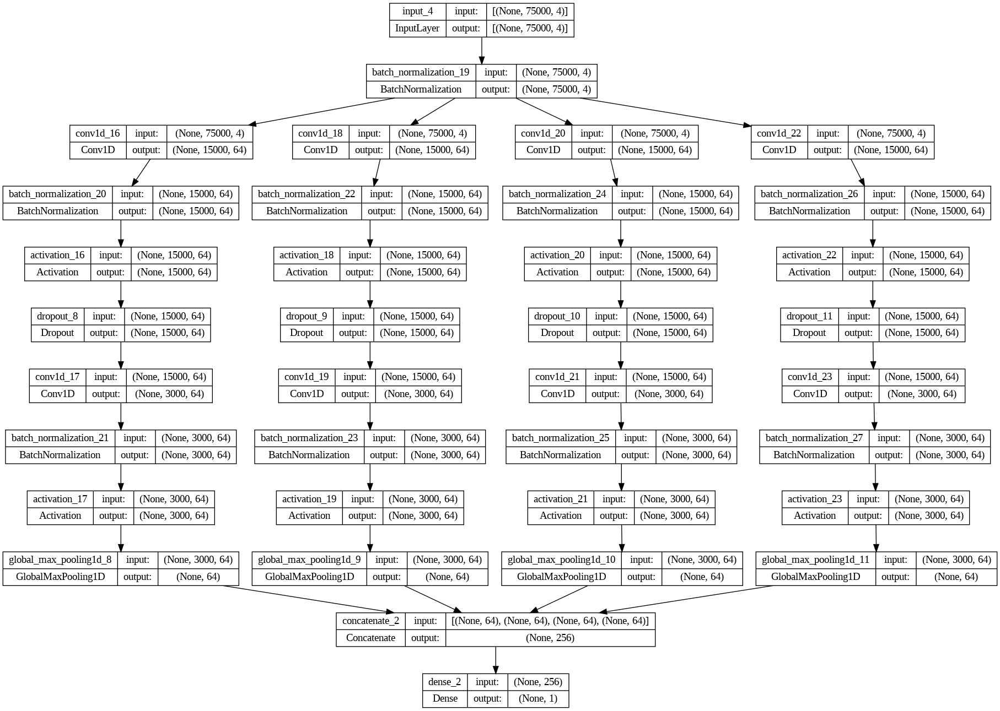

In [ ]:
keras.utils.plot_model(model1, "modelo_1.png", show_shapes=True)

###MODELO 2,  CONVD1 implementado para clasificar entre falsas y verdaderas arritmias con KERNELS DIFERENTES

In [ ]:
samples_per_signal = 75000
num_of_signals = 4  # Editar acá con 2 0 4 dependiendo de la entrada de la señal


# Definir el valor de regularización L2
l2_reg = 0.0005

input_shape = (samples_per_signal,num_of_signals)
inputs = keras.Input(shape=(input_shape))

x = layers.BatchNormalization()(inputs)


x1 = tf.keras.layers.Conv1D(filters=64, kernel_size=11, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x)
x1 = layers.BatchNormalization()(x1)
x1 = layers.Activation("relu")(x1)
x1 = layers.Dropout(0.85)(x1)
x1 = tf.keras.layers.Conv1D(filters=64, kernel_size=11, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x1)
x1 = layers.BatchNormalization()(x1)
x1 = layers.Activation("relu")(x1)
y1 = layers.GlobalMaxPooling1D()(x1)

x2 = tf.keras.layers.Conv1D(filters=64, kernel_size=75, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x)
x2 = layers.BatchNormalization()(x2)
x2 = layers.Activation("relu")(x2)
x2 = layers.Dropout(0.85)(x2)
x2 = tf.keras.layers.Conv1D(filters=64, kernel_size=75, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x2)
x2 = layers.BatchNormalization()(x2)
x2 = layers.Activation("relu")(x2)
y2 = layers.GlobalMaxPooling1D()(x2)

x3 = tf.keras.layers.Conv1D(filters=64, kernel_size=150, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x)
x3 = layers.BatchNormalization()(x3)
x3 = layers.Activation("relu")(x3)
x3 = layers.Dropout(0.85)(x3)
x3 = tf.keras.layers.Conv1D(filters=64, kernel_size=150, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x3)
x3 = layers.BatchNormalization()(x3)
x3 = layers.Activation("relu")(x3)
y3 = layers.GlobalMaxPooling1D()(x3)

x4 = tf.keras.layers.Conv1D(filters=64, kernel_size=400, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x)
x4 = layers.BatchNormalization()(x4)
x4 = layers.Activation("relu")(x4)
x4 = layers.Dropout(0.85)(x4)
x4 = tf.keras.layers.Conv1D(filters=64, kernel_size=400, strides=5, padding="same", kernel_initializer='he_uniform',kernel_regularizer=regularizers.l2(l2_reg))(x4)
x4 = layers.BatchNormalization()(x4)
x4 = layers.Activation("relu")(x4)
y4 = layers.GlobalMaxPooling1D()(x4)

y = concatenate([y1, y2, y3, y4])

#y = layers.Dropout(0.3)(y)

outputs = layers.Dense(1, activation="sigmoid", kernel_initializer='glorot_uniform',kernel_regularizer=regularizers.l2(l2_reg))(y)

model2 = keras.Model(inputs=inputs, outputs=outputs, name="signal_encoder")

# Diagrama de bloques
keras.utils.plot_model(model2, "modelo2.png", show_shapes=True)

# Resumen
model2.summary()

Model: "signal_encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 75000, 4)]           0         []                            
                                                                                                  
 batch_normalization_28 (Ba  (None, 75000, 4)             16        ['input_5[0][0]']             
 tchNormalization)                                                                                
                                                                                                  
 conv1d_24 (Conv1D)          (None, 15000, 64)            2880      ['batch_normalization_28[0][0]
                                                                    ']                            
                                                                                     

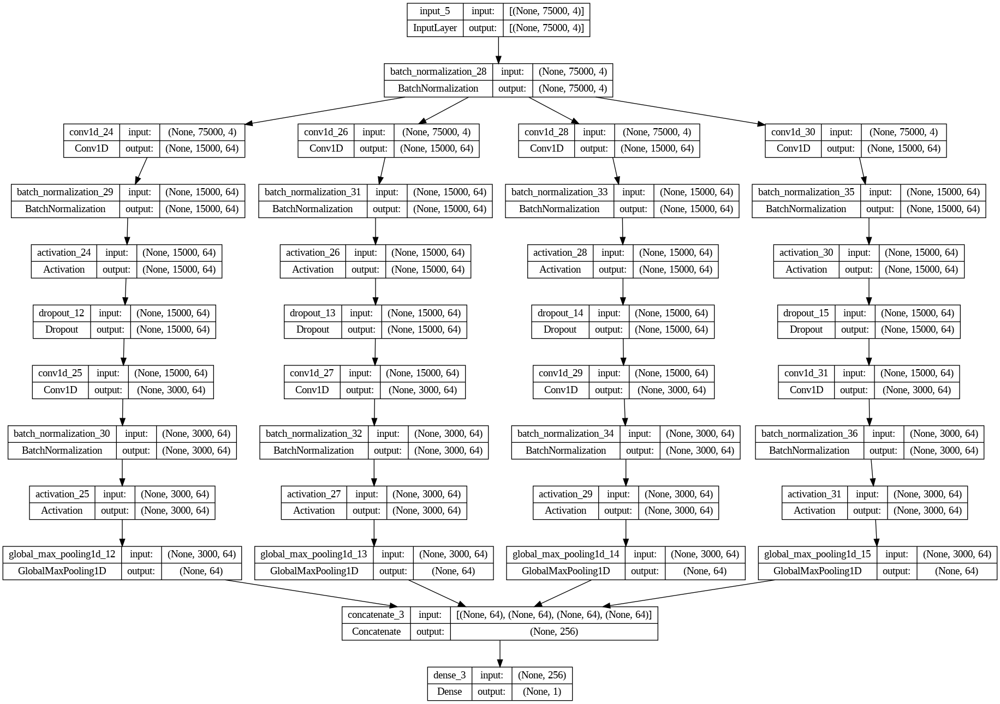

In [ ]:
keras.utils.plot_model(model2, "modelo_tomate.png", show_shapes=True)

In [ ]:
from sklearn.model_selection import train_test_split

callbacks = [
    EarlyStopping(monitor='val_loss', patience=15),
    ReduceLROnPlateau(monitor='val_accuracy', factor=0.2, patience=3, min_lr=0.0001),
]

# Compila el modelo
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento
history=model.fit(X_train, y_train, epochs=3, batch_size=32, validation_data=(X_val,y_val))

Epoch 1/3
 1/15 [=>............................] - ETA: 19:08 - loss: 2.3356 - accuracy: 0.6250

----------------------------------------------
#**RESULTADOS**
----------------------------------------------
###Algunas métricas y testeos para los algoritmos desarrollados por combinacion tanto CON Aumento de datos como SIN aumento de datos

In [5]:
#ACCEDIENDO A LOS DATOS..

#Conexión al drive
data_path_3 = '/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/Señales Preprocesadas/GERMAN/datos_CONV3.h5'
data_path_ALL = '/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/Señales Preprocesadas/GERMAN/datos_CONV_ALL.h5'

######DATOS COMBINACIÓN 3

In [6]:
# Crear un diccionario para almacenar los datos cargados
loaded_data_3 = {}

# Cargar los datos desde el archivo H5 y almacenarlos en el diccionario
with h5py.File(data_path_3, 'r') as hf:
    for dataset_name_3 in hf.keys():
        # Obtener el nombre de la variable asociada al conjunto de datos
        variable_name_3 = dataset_name_3

        # Cargar los datos y almacenarlos en el diccionario
        loaded_data_3[variable_name_3] = np.array(hf[variable_name_3])

In [8]:
# Subdividir los datos 80% para train, 10% validation y 10% test

X_test3 = loaded_data_3['X_test']
y_test3 = loaded_data_3['y_test']

print("Tamaño de X_test:", X_test3.shape)
print("Tamaño de y_test:", y_test3.shape)

Tamaño de X_test: (67, 75000, 2)
Tamaño de y_test: (67, 1)


#####DATOS COMBINACIÓN TOTAL

In [9]:
# Crear un diccionario para almacenar los datos cargados
loaded_data_ALL = {}

# Cargar los datos desde el archivo H5 y almacenarlos en el diccionario
with h5py.File(data_path_ALL, 'r') as hf:
    for dataset_name_ALL in hf.keys():
        # Obtener el nombre de la variable asociada al conjunto de datos
        variable_name_ALL = dataset_name_ALL

        # Cargar los datos y almacenarlos en el diccionario
        loaded_data_ALL[variable_name_ALL] = np.array(hf[variable_name_ALL])

In [10]:
# Subdividir los datos 80% para train, 10% validation y 10% test
X_testALL = loaded_data_ALL['X_test']
y_testALL = loaded_data_ALL['y_test']

print("Tamaño de X_test:", X_testALL.shape)
print("Tamaño de y_test:", y_testALL.shape)

Tamaño de X_test: (75, 75000, 4)
Tamaño de y_test: (75, 1)


### Acceso a Modelos entrenados Combinación 3 y ALL para la prueba 5 SIN DATA AUGMENTATION


In [47]:
#ACCEDIENDO A LOS MODELOS ENTRENADOS SIN DATA AUGMENTATION...

#Conexión al drive

#Path para encontrar los Modelos 1 y 2 de la Combinación 3

Comb3_Model1_NoData = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/MODELOS ENTRENADOS/SIN DATA AUGMENTATION/COMBINACION 3/PRUEBA 5"
Comb3_Model2_NoData = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/MODELOS ENTRENADOS/SIN DATA AUGMENTATION/COMBINACION 3/PRUEBA 6"

#Path para encontrar los Modelos 1 y 2 de la Combinación ALL
CombALL_Model1_NoData = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/MODELOS ENTRENADOS/SIN DATA AUGMENTATION/COMBINACION TOTAL/PRUEBA 5"
CombALL_Model2_NoData = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/MODELOS ENTRENADOS/SIN DATA AUGMENTATION/COMBINACION TOTAL/PRUEBA 6"

### Acceso a Modelos entrenados Combinación 3 y ALL para la prueba 5 CON DATA AUGMENTATION


In [84]:
#ACCEDIENDO A LOS MODELOS ENTRENADOS CON DATA AUGMENTATION...

#Conexión al drive

#Path para encontrar los Modelos 1 y 2 de la Combinación 3

Comb3_Model1_SiData = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/MODELOS ENTRENADOS/CON DATA AUGMENTATION/COMBINACIÓN 3/PRUEBA 5"
Comb3_Model2_SiData = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/MODELOS ENTRENADOS/CON DATA AUGMENTATION/COMBINACIÓN 3/PRUEBA 6"

#Path para encontrar los Modelos 1 y 2 de la Combinación ALL

CombALL_Model1_SiData = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/MODELOS ENTRENADOS/CON DATA AUGMENTATION/COMBINACIÓN TOTAL/PRUEBA 5"
CombALL_Model2_SiData = "/content/gdrive/MyDrive/2023 Karol Ardila y Germán Moreno/Code/MODELOS ENTRENADOS/CON DATA AUGMENTATION/COMBINACIÓN TOTAL/PRUEBA 6"

###Carga de Modelos entrenados y evaluación de métricas para modelos SIN aumento de datos

#####Modelo 1, Combinación 3

In [15]:
# Lista para almacenar los modelos cargados
loaded_models = []

# Cargar los 5 modelos
for fold in range(1, 6):  # Iteramos sobre los 5 folds
    # Construir la ruta completa del modelo para este fold
    model_path = f"{Comb3_Model1_NoData}/best_model_fold_{fold}_P5C3_.keras"

    # Cargar el modelo
    model = load_model(model_path)

    # Agregar el modelo cargado a la lista
    loaded_models.append(model)


In [34]:
fold_test_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_roc_aucs = []
fold_specifity = []
fold_score = []


for model in loaded_models:

    # Evaluar el modelo en el conjunto de prueba
    test_loss, test_accuracy = model.evaluate(X_test3, y_test3, verbose=0)

    # Obtener las predicciones en el conjunto de prueba
    y_pred_probs = model.predict(X_test3)

    # Convertir las probabilidades a clases binarias basadas en un umbral (PUEDE SER EL ERROR)
    threshold = 0.5
    y_pred_binary = (y_pred_probs > threshold).astype(int)

    # Convertir las etiquetas a clases binarias
    y_true_binary = (y_test3 > 0.5).astype(int)

    # Calcular métricas
    accuracy = accuracy_score(y_true_binary, y_pred_binary)
    precision = precision_score(y_true_binary, y_pred_binary)
    recall = recall_score(y_true_binary, y_pred_binary)
    f1 = f1_score(y_true_binary, y_pred_binary)
    roc_auc = roc_auc_score(y_true_binary, y_pred_probs)
    conf_matrix = confusion_matrix(y_true_binary, y_pred_binary, labels=[1, 0])
    TN, FP, FN, TP = conf_matrix.ravel()

    # Calcular la especificidad
    specificity = TN / (TN + FP)

    # Calcular el score del challenge
    score = (TP + TN) / (TP + TN + FP + (5 * FN))

    fold_test_accuracies.append(test_accuracy)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1)
    fold_roc_aucs.append(roc_auc)
    fold_specifity.append(specificity)
    fold_score.append(score)


print("\n")
print("----------------------------------------------")
print(" METRICAS DE EVALUACIÓN FINALES EN CADA FOLD")
print("----------------------------------------------")
print("\n")

print("\n")
print(" PARA TESTEO ")
print('El accuracy de cada fold es: ',fold_test_accuracies)
Media_TEST= np.mean(fold_test_accuracies)
print(f'La Media del accuracy de los k fols es: {Media_TEST}')
Desv_std_TEST = np.std(fold_test_accuracies)
print(f'La Desviación Estandar del accuracy de los k fols es: {Desv_std_TEST}')

Min_TEST = Media_TEST - Desv_std_TEST
Max_TEST = Media_TEST + Desv_std_TEST
print(f'El accuracy mínimo es: {Min_TEST}')
print(f'El accuracy máximo es: {Max_TEST}')


print("\n")
print(" PARA LA MÉTRICA DE PRECISIÓN ")
print('La precisión cada fold es: ',fold_precisions)
mean_precision = np.mean(fold_precisions)
print(f'La Media de la precisión de los k fols es: {mean_precision}')
std_precision = np.std(fold_precisions)
print(f'La Desviación Estandar de la precisión de los k fols es: {std_precision}')
Min_precision = mean_precision - std_precision
Max_precision = mean_precision + std_precision
print(f'La precisión mínima es: {Min_precision}')
print(f'La precisión máxima es: {Max_precision}')


print("\n")
print(" PARA LA MÉTRICA DE RECALL ")
print('El recall de cada fold es: ',fold_recalls)
mean_recall = np.mean(fold_recalls)
print(f'La Media del recall de los k fols es: {mean_recall}')
std_recall = np.std(fold_recalls)
print(f'La Desviación Estandar del recall de los k fols es: {std_recall}')
Min_recall = mean_recall - std_recall
Max_recall = mean_recall + std_recall
print(f'El Recall mínimo es: {Min_recall}')
print(f'El Recall máximo es: {Max_recall}')


print("\n")
print(" PARA LA MÉTRICA DE F1 SCORE ")
print('El F1 SCORE de cada fold es: ',fold_f1_scores)
mean_f1_score = np.mean(fold_f1_scores)
print(f'La Media del F1 SCORE de los k fols es: {mean_f1_score}')
std_f1_score = np.std(fold_f1_scores)
print(f'La Desviación Estandar del F1 SCORE de los k fols es: {std_f1_score}')
Min_f1_score = mean_f1_score - std_f1_score
Max_f1_score = mean_f1_score + std_f1_score
print(f'El F1 SCORE mínimo es: {Min_f1_score}')
print(f'El F1 SCORE máximo es: {Max_f1_score}')


print("\n")
print(" PARA EL ROC SCORE ")
print('El ROC SCORE de cada fold es: ',fold_roc_aucs)
mean_roc_auc = np.mean(fold_roc_aucs)
print(f'La Media del ROC SCORE de los k fols es: {mean_roc_auc}')
std_roc_auc = np.std(fold_roc_aucs)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_roc_auc}')
Min_roc_auc = mean_roc_auc - std_roc_auc
Max_roc_auc = mean_roc_auc + std_roc_auc
print(f'El ROC SCORE mínimo es: {Min_roc_auc}')
print(f'El ROC SCORE máximo es: {Max_roc_auc}')


print("\n")
print(" PARA LA ESPECIFIDAD ")
print('El ROC SCORE de cada fold es: ',fold_specifity)
mean_specify = np.mean(fold_specifity)
print(f'La Media del ROC SCORE de los k fols es: {mean_specify}')
std_specify = np.std(fold_specifity)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_specify}')
Min_specify = mean_specify - std_specify
Max_specify  = mean_specify + std_specify
print(f'La Especifidad mínima es: {Min_specify}')
print(f'La Especifidad máxima es: {Max_specify}')


print("\n")
print(" PARA EL SCORE DEL PHYSIONET")
print('El SCORE de cada fold es: ',fold_score)
mean_score = np.mean(fold_score)
print(f'La Media del SCORE de los k fols es: {mean_score}')
std_score = np.std(fold_score)
print(f'La Desviación Estandar del SCORE de los k fols es: {std_score}')
Min_score = mean_score - std_score
Max_score = mean_score + std_score
print(f'El SCORE mínimo es: {Min_score}')
print(f'El SCORE máximo es: {Max_score}')

3/3 [==============================] - 30s 8s/step


----------------------------------------------
 METRICAS DE EVALUACIÓN FINALES EN CADA FOLD
----------------------------------------------




 PARA TESTEO 
El accuracy de cada fold es:  [0.7761194109916687, 0.8208954930305481, 0.8059701323509216, 0.7611940503120422, 0.7313432693481445]
La Media del accuracy de los k fols es: 0.779104471206665
La Desviación Estandar del accuracy de los k fols es: 0.03187186664719319
El accuracy mínimo es: 0.7472326045594718
El accuracy máximo es: 0.8109763378538583


 PARA LA MÉTRICA DE PRECISIÓN 
La precisión cada fold es:  [0.7647058823529411, 0.7307692307692307, 1.0, 0.7, 0.875]
La Media de la precisión de los k fols es: 0.8140950226244345
La Desviación Estandar de la precisión de los k fols es: 0.11015464205820097
La precisión mínima es: 0.7039403805662334
La precisión máxima es: 0.9242496646826355


 PARA LA MÉTRICA DE RECALL 
El recall de cada fold es:  [0.5416666666666666, 0.7916666666666666, 

#####Modelo 2, Combinación 3

In [35]:
# Lista para almacenar los modelos cargados
loaded_models = []

# Cargar los 5 modelos
for fold in range(1, 6):  # Iteramos sobre los 5 folds
    # Construir la ruta completa del modelo para este fold
    model_path = f"{Comb3_Model2_NoData}/best_model_fold3_P3_{fold}_2201.keras"

    # Cargar el modelo
    model = load_model(model_path)

    # Agregar el modelo cargado a la lista
    loaded_models.append(model)


In [36]:
fold_test_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_roc_aucs = []
fold_specifity = []
fold_score = []


for model in loaded_models:

    # Evaluar el modelo en el conjunto de prueba
    test_loss, test_accuracy = model.evaluate(X_test3, y_test3, verbose=0)

    # Obtener las predicciones en el conjunto de prueba
    y_pred_probs = model.predict(X_test3)

    # Convertir las probabilidades a clases binarias basadas en un umbral (PUEDE SER EL ERROR)
    threshold = 0.5
    y_pred_binary = (y_pred_probs > threshold).astype(int)

    # Convertir las etiquetas a clases binarias
    y_true_binary = (y_test3 > 0.5).astype(int)

    # Calcular métricas
    accuracy = accuracy_score(y_true_binary, y_pred_binary)
    precision = precision_score(y_true_binary, y_pred_binary)
    recall = recall_score(y_true_binary, y_pred_binary)
    f1 = f1_score(y_true_binary, y_pred_binary)
    roc_auc = roc_auc_score(y_true_binary, y_pred_probs)
    conf_matrix = confusion_matrix(y_true_binary, y_pred_binary, labels=[1, 0])
    TN, FP, FN, TP = conf_matrix.ravel()

    # Calcular la especificidad
    specificity = TN / (TN + FP)

    # Calcular el score del challenge
    score = (TP + TN) / (TP + TN + FP + (5 * FN))

    fold_test_accuracies.append(test_accuracy)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1)
    fold_roc_aucs.append(roc_auc)
    fold_specifity.append(specificity)
    fold_score.append(score)


print("\n")
print("----------------------------------------------")
print(" METRICAS DE EVALUACIÓN FINALES EN CADA FOLD")
print("----------------------------------------------")
print("\n")

print("\n")
print(" PARA TESTEO ")
print('El accuracy de cada fold es: ',fold_test_accuracies)
Media_TEST= np.mean(fold_test_accuracies)
print(f'La Media del accuracy de los k fols es: {Media_TEST}')
Desv_std_TEST = np.std(fold_test_accuracies)
print(f'La Desviación Estandar del accuracy de los k fols es: {Desv_std_TEST}')

Min_TEST = Media_TEST - Desv_std_TEST
Max_TEST = Media_TEST + Desv_std_TEST
print(f'El accuracy mínimo es: {Min_TEST}')
print(f'El accuracy máximo es: {Max_TEST}')


print("\n")
print(" PARA LA MÉTRICA DE PRECISIÓN ")
print('La precisión cada fold es: ',fold_precisions)
mean_precision = np.mean(fold_precisions)
print(f'La Media de la precisión de los k fols es: {mean_precision}')
std_precision = np.std(fold_precisions)
print(f'La Desviación Estandar de la precisión de los k fols es: {std_precision}')
Min_precision = mean_precision - std_precision
Max_precision = mean_precision + std_precision
print(f'La precisión mínima es: {Min_precision}')
print(f'La precisión máxima es: {Max_precision}')


print("\n")
print(" PARA LA MÉTRICA DE RECALL ")
print('El recall de cada fold es: ',fold_recalls)
mean_recall = np.mean(fold_recalls)
print(f'La Media del recall de los k fols es: {mean_recall}')
std_recall = np.std(fold_recalls)
print(f'La Desviación Estandar del recall de los k fols es: {std_recall}')
Min_recall = mean_recall - std_recall
Max_recall = mean_recall + std_recall
print(f'El Recall mínimo es: {Min_recall}')
print(f'El Recall máximo es: {Max_recall}')


print("\n")
print(" PARA LA MÉTRICA DE F1 SCORE ")
print('El F1 SCORE de cada fold es: ',fold_f1_scores)
mean_f1_score = np.mean(fold_f1_scores)
print(f'La Media del F1 SCORE de los k fols es: {mean_f1_score}')
std_f1_score = np.std(fold_f1_scores)
print(f'La Desviación Estandar del F1 SCORE de los k fols es: {std_f1_score}')
Min_f1_score = mean_f1_score - std_f1_score
Max_f1_score = mean_f1_score + std_f1_score
print(f'El F1 SCORE mínimo es: {Min_f1_score}')
print(f'El F1 SCORE máximo es: {Max_f1_score}')


print("\n")
print(" PARA EL ROC SCORE ")
print('El ROC SCORE de cada fold es: ',fold_roc_aucs)
mean_roc_auc = np.mean(fold_roc_aucs)
print(f'La Media del ROC SCORE de los k fols es: {mean_roc_auc}')
std_roc_auc = np.std(fold_roc_aucs)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_roc_auc}')
Min_roc_auc = mean_roc_auc - std_roc_auc
Max_roc_auc = mean_roc_auc + std_roc_auc
print(f'El ROC SCORE mínimo es: {Min_roc_auc}')
print(f'El ROC SCORE máximo es: {Max_roc_auc}')


print("\n")
print(" PARA LA ESPECIFIDAD ")
print('El ROC SCORE de cada fold es: ',fold_specifity)
mean_specify = np.mean(fold_specifity)
print(f'La Media del ROC SCORE de los k fols es: {mean_specify}')
std_specify = np.std(fold_specifity)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_specify}')
Min_specify = mean_specify - std_specify
Max_specify  = mean_specify + std_specify
print(f'La Especifidad mínima es: {Min_specify}')
print(f'La Especifidad máxima es: {Max_specify}')


print("\n")
print(" PARA EL SCORE DEL PHYSIONET")
print('El SCORE de cada fold es: ',fold_score)
mean_score = np.mean(fold_score)
print(f'La Media del SCORE de los k fols es: {mean_score}')
std_score = np.std(fold_score)
print(f'La Desviación Estandar del SCORE de los k fols es: {std_score}')
Min_score = mean_score - std_score
Max_score = mean_score + std_score
print(f'El SCORE mínimo es: {Min_score}')
print(f'El SCORE máximo es: {Max_score}')

3/3 [==============================] - 26s 6s/step


3/3 [==============================] - 26s 7s/step


----------------------------------------------
 METRICAS DE EVALUACIÓN FINALES EN CADA FOLD
----------------------------------------------




 PARA TESTEO 
El accuracy de cada fold es:  [0.7910447716712952, 0.746268630027771, 0.8059701323509216, 0.7611940503120422, 0.7910447716712952]
La Media del accuracy de los k fols es: 0.779104471206665
La Desviación Estandar del accuracy de los k fols es: 0.021935728579818844
El accuracy mínimo es: 0.7571687426268462
El accuracy máximo es: 0.8010401997864839


 PARA LA MÉTRICA DE PRECISIÓN 
La precisión cada fold es:  [0.6923076923076923, 0.6060606060606061, 0.7037037037037037, 0.7, 0.75]
La Media de la precisión de los k fols es: 0.6904144004144005
La Desviación Estandar de la precisión de los k fols es: 0.04677195774260763
La precisión mínima es: 0.6436424426717928
La precisión máxima es: 0.7371863581570082


 PARA LA MÉTRICA DE RECALL 
El recall de cada fold es:  [0.75, 0.8333333333333334, 

#####Modelo 1, Combinación ALL

In [50]:
# Lista para almacenar los modelos cargados
loaded_models = []

# Cargar los 5 modelos
for fold in range(1, 6):  # Iteramos sobre los 5 folds
    # Construir la ruta completa del modelo para este fold
    model_path = f"{CombALL_Model1_NoData} /best_model_foldALL_P2_{fold}.keras"

    # Cargar el modelo
    model = load_model(model_path)

    # Agregar el modelo cargado a la lista
    loaded_models.append(model)


In [46]:
fold_test_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_roc_aucs = []
fold_specifity = []
fold_score = []


for model in loaded_models:

    # Evaluar el modelo en el conjunto de prueba
    test_loss, test_accuracy = model.evaluate(X_testALL, y_testALL, verbose=0)

    # Obtener las predicciones en el conjunto de prueba
    y_pred_probs = model.predict(X_testALL)

    # Convertir las probabilidades a clases binarias basadas en un umbral
    threshold = 0.5
    y_pred_binary = (y_pred_probs > threshold).astype(int)

    # Convertir las etiquetas a clases binarias
    y_true_binary = (y_testALL > 0.5).astype(int)

    # Calcular métricas
    accuracy = accuracy_score(y_true_binary, y_pred_binary)
    precision = precision_score(y_true_binary, y_pred_binary)
    recall = recall_score(y_true_binary, y_pred_binary)
    f1 = f1_score(y_true_binary, y_pred_binary)
    roc_auc = roc_auc_score(y_true_binary, y_pred_probs)
    conf_matrix = confusion_matrix(y_true_binary, y_pred_binary, labels=[1, 0])
    TN, FP, FN, TP = conf_matrix.ravel()

    # Calcular la especificidad
    specificity = TN / (TN + FP)

    # Calcular el score del challenge
    score = (TP + TN) / (TP + TN + FP + (5 * FN))

    fold_test_accuracies.append(test_accuracy)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1)
    fold_roc_aucs.append(roc_auc)
    fold_specifity.append(specificity)
    fold_score.append(score)


print("\n")
print("----------------------------------------------")
print(" METRICAS DE EVALUACIÓN FINALES EN CADA FOLD")
print("----------------------------------------------")
print("\n")

print("\n")
print(" PARA TESTEO ")
print('El accuracy de cada fold es: ',fold_test_accuracies)
Media_TEST= np.mean(fold_test_accuracies)
print(f'La Media del accuracy de los k fols es: {Media_TEST}')
Desv_std_TEST = np.std(fold_test_accuracies)
print(f'La Desviación Estandar del accuracy de los k fols es: {Desv_std_TEST}')

Min_TEST = Media_TEST - Desv_std_TEST
Max_TEST = Media_TEST + Desv_std_TEST
print(f'El accuracy mínimo es: {Min_TEST}')
print(f'El accuracy máximo es: {Max_TEST}')


print("\n")
print(" PARA LA MÉTRICA DE PRECISIÓN ")
print('La precisión cada fold es: ',fold_precisions)
mean_precision = np.mean(fold_precisions)
print(f'La Media de la precisión de los k fols es: {mean_precision}')
std_precision = np.std(fold_precisions)
print(f'La Desviación Estandar de la precisión de los k fols es: {std_precision}')
Min_precision = mean_precision - std_precision
Max_precision = mean_precision + std_precision
print(f'La precisión mínima es: {Min_precision}')
print(f'La precisión máxima es: {Max_precision}')


print("\n")
print(" PARA LA MÉTRICA DE RECALL ")
print('El recall de cada fold es: ',fold_recalls)
mean_recall = np.mean(fold_recalls)
print(f'La Media del recall de los k fols es: {mean_recall}')
std_recall = np.std(fold_recalls)
print(f'La Desviación Estandar del recall de los k fols es: {std_recall}')
Min_recall = mean_recall - std_recall
Max_recall = mean_recall + std_recall
print(f'El Recall mínimo es: {Min_recall}')
print(f'El Recall máximo es: {Max_recall}')


print("\n")
print(" PARA LA MÉTRICA DE F1 SCORE ")
print('El F1 SCORE de cada fold es: ',fold_f1_scores)
mean_f1_score = np.mean(fold_f1_scores)
print(f'La Media del F1 SCORE de los k fols es: {mean_f1_score}')
std_f1_score = np.std(fold_f1_scores)
print(f'La Desviación Estandar del F1 SCORE de los k fols es: {std_f1_score}')
Min_f1_score = mean_f1_score - std_f1_score
Max_f1_score = mean_f1_score + std_f1_score
print(f'El F1 SCORE mínimo es: {Min_f1_score}')
print(f'El F1 SCORE máximo es: {Max_f1_score}')


print("\n")
print(" PARA EL ROC SCORE ")
print('El ROC SCORE de cada fold es: ',fold_roc_aucs)
mean_roc_auc = np.mean(fold_roc_aucs)
print(f'La Media del ROC SCORE de los k fols es: {mean_roc_auc}')
std_roc_auc = np.std(fold_roc_aucs)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_roc_auc}')
Min_roc_auc = mean_roc_auc - std_roc_auc
Max_roc_auc = mean_roc_auc + std_roc_auc
print(f'El ROC SCORE mínimo es: {Min_roc_auc}')
print(f'El ROC SCORE máximo es: {Max_roc_auc}')


print("\n")
print(" PARA LA ESPECIFIDAD ")
print('El ROC SCORE de cada fold es: ',fold_specifity)
mean_specify = np.mean(fold_specifity)
print(f'La Media del ROC SCORE de los k fols es: {mean_specify}')
std_specify = np.std(fold_specifity)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_specify}')
Min_specify = mean_specify - std_specify
Max_specify  = mean_specify + std_specify
print(f'La Especifidad mínima es: {Min_specify}')
print(f'La Especifidad máxima es: {Max_specify}')


print("\n")
print(" PARA EL SCORE DEL PHYSIONET")
print('El SCORE de cada fold es: ',fold_score)
mean_score = np.mean(fold_score)
print(f'La Media del SCORE de los k fols es: {mean_score}')
std_score = np.std(fold_score)
print(f'La Desviación Estandar del SCORE de los k fols es: {std_score}')
Min_score = mean_score - std_score
Max_score = mean_score + std_score
print(f'El SCORE mínimo es: {Min_score}')
print(f'El SCORE máximo es: {Max_score}')

3/3 [==============================] - 41s 12s/step


----------------------------------------------
 METRICAS DE EVALUACIÓN FINALES EN CADA FOLD
----------------------------------------------




 PARA TESTEO 
El accuracy de cada fold es:  [0.6800000071525574, 0.6133333444595337, 0.6399999856948853, 0.5866666436195374, 0.7200000286102295]
La Media del accuracy de los k fols es: 0.6480000019073486
La Desviación Estandar del accuracy de los k fols es: 0.04740371803513685
El accuracy mínimo es: 0.6005962838722118
El accuracy máximo es: 0.6954037199424855


 PARA LA MÉTRICA DE PRECISIÓN 
La precisión cada fold es:  [0.5925925925925926, 0.5, 0.5416666666666666, 0.45454545454545453, 0.6818181818181818]
La Media de la precisión de los k fols es: 0.554124579124579
La Desviación Estandar de la precisión de los k fols es: 0.07846797554316483
La precisión mínima es: 0.4756566035814142
La precisión máxima es: 0.6325925546677439


 PARA LA MÉTRICA DE RECALL 
El recall de cada fold es:  [0.55172413

#####Modelo 2, Combinación ALL

In [52]:
# Lista para almacenar los modelos cargados
loaded_models = []

# Cargar los 5 modelos
for fold in range(1, 6):  # Iteramos sobre los 5 folds
    # Construir la ruta completa del modelo para este fold
    model_path = f"{CombALL_Model2_NoData}/best_model_fold_{fold}_P6CA_.keras"

    # Cargar el modelo
    model = load_model(model_path)

    # Agregar el modelo cargado a la lista
    loaded_models.append(model)


In [53]:
fold_test_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_roc_aucs = []
fold_specifity = []
fold_score = []


for model in loaded_models:

    # Evaluar el modelo en el conjunto de prueba
    test_loss, test_accuracy = model.evaluate(X_testALL, y_testALL, verbose=0)

    # Obtener las predicciones en el conjunto de prueba
    y_pred_probs = model.predict(X_testALL)

    # Convertir las probabilidades a clases binarias basadas en un umbral
    threshold = 0.5
    y_pred_binary = (y_pred_probs > threshold).astype(int)

    # Convertir las etiquetas a clases binarias
    y_true_binary = (y_testALL > 0.5).astype(int)

    # Calcular métricas
    accuracy = accuracy_score(y_true_binary, y_pred_binary)
    precision = precision_score(y_true_binary, y_pred_binary)
    recall = recall_score(y_true_binary, y_pred_binary)
    f1 = f1_score(y_true_binary, y_pred_binary)
    roc_auc = roc_auc_score(y_true_binary, y_pred_probs)
    conf_matrix = confusion_matrix(y_true_binary, y_pred_binary, labels=[1, 0])
    TN, FP, FN, TP = conf_matrix.ravel()

    # Calcular la especificidad
    specificity = TN / (TN + FP)

    # Calcular el score del challenge
    score = (TP + TN) / (TP + TN + FP + (5 * FN))

    fold_test_accuracies.append(test_accuracy)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1)
    fold_roc_aucs.append(roc_auc)
    fold_specifity.append(specificity)
    fold_score.append(score)


print("\n")
print("----------------------------------------------")
print(" METRICAS DE EVALUACIÓN FINALES EN CADA FOLD")
print("----------------------------------------------")
print("\n")

print("\n")
print(" PARA TESTEO ")
print('El accuracy de cada fold es: ',fold_test_accuracies)
Media_TEST= np.mean(fold_test_accuracies)
print(f'La Media del accuracy de los k fols es: {Media_TEST}')
Desv_std_TEST = np.std(fold_test_accuracies)
print(f'La Desviación Estandar del accuracy de los k fols es: {Desv_std_TEST}')

Min_TEST = Media_TEST - Desv_std_TEST
Max_TEST = Media_TEST + Desv_std_TEST
print(f'El accuracy mínimo es: {Min_TEST}')
print(f'El accuracy máximo es: {Max_TEST}')


print("\n")
print(" PARA LA MÉTRICA DE PRECISIÓN ")
print('La precisión cada fold es: ',fold_precisions)
mean_precision = np.mean(fold_precisions)
print(f'La Media de la precisión de los k fols es: {mean_precision}')
std_precision = np.std(fold_precisions)
print(f'La Desviación Estandar de la precisión de los k fols es: {std_precision}')
Min_precision = mean_precision - std_precision
Max_precision = mean_precision + std_precision
print(f'La precisión mínima es: {Min_precision}')
print(f'La precisión máxima es: {Max_precision}')


print("\n")
print(" PARA LA MÉTRICA DE RECALL ")
print('El recall de cada fold es: ',fold_recalls)
mean_recall = np.mean(fold_recalls)
print(f'La Media del recall de los k fols es: {mean_recall}')
std_recall = np.std(fold_recalls)
print(f'La Desviación Estandar del recall de los k fols es: {std_recall}')
Min_recall = mean_recall - std_recall
Max_recall = mean_recall + std_recall
print(f'El Recall mínimo es: {Min_recall}')
print(f'El Recall máximo es: {Max_recall}')


print("\n")
print(" PARA LA MÉTRICA DE F1 SCORE ")
print('El F1 SCORE de cada fold es: ',fold_f1_scores)
mean_f1_score = np.mean(fold_f1_scores)
print(f'La Media del F1 SCORE de los k fols es: {mean_f1_score}')
std_f1_score = np.std(fold_f1_scores)
print(f'La Desviación Estandar del F1 SCORE de los k fols es: {std_f1_score}')
Min_f1_score = mean_f1_score - std_f1_score
Max_f1_score = mean_f1_score + std_f1_score
print(f'El F1 SCORE mínimo es: {Min_f1_score}')
print(f'El F1 SCORE máximo es: {Max_f1_score}')


print("\n")
print(" PARA EL ROC SCORE ")
print('El ROC SCORE de cada fold es: ',fold_roc_aucs)
mean_roc_auc = np.mean(fold_roc_aucs)
print(f'La Media del ROC SCORE de los k fols es: {mean_roc_auc}')
std_roc_auc = np.std(fold_roc_aucs)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_roc_auc}')
Min_roc_auc = mean_roc_auc - std_roc_auc
Max_roc_auc = mean_roc_auc + std_roc_auc
print(f'El ROC SCORE mínimo es: {Min_roc_auc}')
print(f'El ROC SCORE máximo es: {Max_roc_auc}')


print("\n")
print(" PARA LA ESPECIFIDAD ")
print('El ROC SCORE de cada fold es: ',fold_specifity)
mean_specify = np.mean(fold_specifity)
print(f'La Media del ROC SCORE de los k fols es: {mean_specify}')
std_specify = np.std(fold_specifity)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_specify}')
Min_specify = mean_specify - std_specify
Max_specify  = mean_specify + std_specify
print(f'La Especifidad mínima es: {Min_specify}')
print(f'La Especifidad máxima es: {Max_specify}')


print("\n")
print(" PARA EL SCORE DEL PHYSIONET")
print('El SCORE de cada fold es: ',fold_score)
mean_score = np.mean(fold_score)
print(f'La Media del SCORE de los k fols es: {mean_score}')
std_score = np.std(fold_score)
print(f'La Desviación Estandar del SCORE de los k fols es: {std_score}')
Min_score = mean_score - std_score
Max_score = mean_score + std_score
print(f'El SCORE mínimo es: {Min_score}')
print(f'El SCORE máximo es: {Max_score}')

3/3 [==============================] - 39s 10s/step


----------------------------------------------
 METRICAS DE EVALUACIÓN FINALES EN CADA FOLD
----------------------------------------------




 PARA TESTEO 
El accuracy de cada fold es:  [0.6266666650772095, 0.6800000071525574, 0.6800000071525574, 0.746666669845581, 0.6399999856948853]
La Media del accuracy de los k fols es: 0.6746666669845581
La Desviación Estandar del accuracy de los k fols es: 0.04182503657243525
El accuracy mínimo es: 0.6328416304121229
El accuracy máximo es: 0.7164917035569933


 PARA LA MÉTRICA DE PRECISIÓN 
La precisión cada fold es:  [0.5217391304347826, 0.5714285714285714, 0.5925925925925926, 0.6785714285714286, 0.5625]
La Media de la precisión de los k fols es: 0.585366344605475
La Desviación Estandar de la precisión de los k fols es: 0.051971068792054084
La precisión mínima es: 0.5333952758134209
La precisión máxima es: 0.637337413397529


 PARA LA MÉTRICA DE RECALL 
El recall de cada fold es:  [0.4137931

###Carga de Modelos entrenados y evaluación de métricas para modelos CON aumento de datos

#####Modelo 1, Combinación 3

In [62]:
# Lista para almacenar los modelos cargados
loaded_models = []

# Cargar los 5 modelos
for fold in range(1, 6):  # Iteramos sobre los 5 folds
    # Construir la ruta completa del modelo para este fold
    model_path = f"{Comb3_Model1_SiData}/best_model_fold_{fold}_P5C3_.keras"

    # Cargar el modelo
    model = load_model(model_path)

    # Agregar el modelo cargado a la lista
    loaded_models.append(model)


In [63]:
fold_test_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_roc_aucs = []
fold_specifity = []
fold_score = []


for model in loaded_models:

    # Evaluar el modelo en el conjunto de prueba
    test_loss, test_accuracy = model.evaluate(X_test3, y_test3, verbose=0)

    # Obtener las predicciones en el conjunto de prueba
    y_pred_probs = model.predict(X_test3)

    # Convertir las probabilidades a clases binarias basadas en un umbral (PUEDE SER EL ERROR)
    threshold = 0.5
    y_pred_binary = (y_pred_probs > threshold).astype(int)

    # Convertir las etiquetas a clases binarias
    y_true_binary = (y_test3 > 0.5).astype(int)

    # Calcular métricas
    accuracy = accuracy_score(y_true_binary, y_pred_binary)
    precision = precision_score(y_true_binary, y_pred_binary)
    recall = recall_score(y_true_binary, y_pred_binary)
    f1 = f1_score(y_true_binary, y_pred_binary)
    roc_auc = roc_auc_score(y_true_binary, y_pred_probs)
    conf_matrix = confusion_matrix(y_true_binary, y_pred_binary, labels=[1, 0])
    TN, FP, FN, TP = conf_matrix.ravel()

    # Calcular la especificidad
    specificity = TN / (TN + FP)

    # Calcular el score del challenge
    score = (TP + TN) / (TP + TN + FP + (5 * FN))

    fold_test_accuracies.append(test_accuracy)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1)
    fold_roc_aucs.append(roc_auc)
    fold_specifity.append(specificity)
    fold_score.append(score)


print("\n")
print("----------------------------------------------")
print(" METRICAS DE EVALUACIÓN FINALES EN CADA FOLD")
print("----------------------------------------------")
print("\n")

print("\n")
print(" PARA TESTEO ")
print('El accuracy de cada fold es: ',fold_test_accuracies)
Media_TEST= np.mean(fold_test_accuracies)
print(f'La Media del accuracy de los k fols es: {Media_TEST}')
Desv_std_TEST = np.std(fold_test_accuracies)
print(f'La Desviación Estandar del accuracy de los k fols es: {Desv_std_TEST}')

Min_TEST = Media_TEST - Desv_std_TEST
Max_TEST = Media_TEST + Desv_std_TEST
print(f'El accuracy mínimo es: {Min_TEST}')
print(f'El accuracy máximo es: {Max_TEST}')


print("\n")
print(" PARA LA MÉTRICA DE PRECISIÓN ")
print('La precisión cada fold es: ',fold_precisions)
mean_precision = np.mean(fold_precisions)
print(f'La Media de la precisión de los k fols es: {mean_precision}')
std_precision = np.std(fold_precisions)
print(f'La Desviación Estandar de la precisión de los k fols es: {std_precision}')
Min_precision = mean_precision - std_precision
Max_precision = mean_precision + std_precision
print(f'La precisión mínima es: {Min_precision}')
print(f'La precisión máxima es: {Max_precision}')


print("\n")
print(" PARA LA MÉTRICA DE RECALL ")
print('El recall de cada fold es: ',fold_recalls)
mean_recall = np.mean(fold_recalls)
print(f'La Media del recall de los k fols es: {mean_recall}')
std_recall = np.std(fold_recalls)
print(f'La Desviación Estandar del recall de los k fols es: {std_recall}')
Min_recall = mean_recall - std_recall
Max_recall = mean_recall + std_recall
print(f'El Recall mínimo es: {Min_recall}')
print(f'El Recall máximo es: {Max_recall}')


print("\n")
print(" PARA LA MÉTRICA DE F1 SCORE ")
print('El F1 SCORE de cada fold es: ',fold_f1_scores)
mean_f1_score = np.mean(fold_f1_scores)
print(f'La Media del F1 SCORE de los k fols es: {mean_f1_score}')
std_f1_score = np.std(fold_f1_scores)
print(f'La Desviación Estandar del F1 SCORE de los k fols es: {std_f1_score}')
Min_f1_score = mean_f1_score - std_f1_score
Max_f1_score = mean_f1_score + std_f1_score
print(f'El F1 SCORE mínimo es: {Min_f1_score}')
print(f'El F1 SCORE máximo es: {Max_f1_score}')


print("\n")
print(" PARA EL ROC SCORE ")
print('El ROC SCORE de cada fold es: ',fold_roc_aucs)
mean_roc_auc = np.mean(fold_roc_aucs)
print(f'La Media del ROC SCORE de los k fols es: {mean_roc_auc}')
std_roc_auc = np.std(fold_roc_aucs)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_roc_auc}')
Min_roc_auc = mean_roc_auc - std_roc_auc
Max_roc_auc = mean_roc_auc + std_roc_auc
print(f'El ROC SCORE mínimo es: {Min_roc_auc}')
print(f'El ROC SCORE máximo es: {Max_roc_auc}')


print("\n")
print(" PARA LA ESPECIFIDAD ")
print('El ROC SCORE de cada fold es: ',fold_specifity)
mean_specify = np.mean(fold_specifity)
print(f'La Media del ROC SCORE de los k fols es: {mean_specify}')
std_specify = np.std(fold_specifity)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_specify}')
Min_specify = mean_specify - std_specify
Max_specify  = mean_specify + std_specify
print(f'La Especifidad mínima es: {Min_specify}')
print(f'La Especifidad máxima es: {Max_specify}')


print("\n")
print(" PARA EL SCORE DEL PHYSIONET")
print('El SCORE de cada fold es: ',fold_score)
mean_score = np.mean(fold_score)
print(f'La Media del SCORE de los k fols es: {mean_score}')
std_score = np.std(fold_score)
print(f'La Desviación Estandar del SCORE de los k fols es: {std_score}')
Min_score = mean_score - std_score
Max_score = mean_score + std_score
print(f'El SCORE mínimo es: {Min_score}')
print(f'El SCORE máximo es: {Max_score}')

3/3 [==============================] - 30s 8s/step


----------------------------------------------
 METRICAS DE EVALUACIÓN FINALES EN CADA FOLD
----------------------------------------------




 PARA TESTEO 
El accuracy de cada fold es:  [0.7611940503120422, 0.746268630027771, 0.7761194109916687, 0.7910447716712952, 0.7313432693481445]
La Media del accuracy de los k fols es: 0.7611940264701843
La Desviación Estandar del accuracy de los k fols es: 0.021107672784552018
El accuracy mínimo es: 0.7400863536856322
El accuracy máximo es: 0.7823016992547364


 PARA LA MÉTRICA DE PRECISIÓN 
La precisión cada fold es:  [0.7222222222222222, 0.6206896551724138, 0.7142857142857143, 0.6923076923076923, 0.65]
La Media de la precisión de los k fols es: 0.6799010567976086
La Desviación Estandar de la precisión de los k fols es: 0.03880044741542514
La precisión mínima es: 0.6411006093821835
La precisión máxima es: 0.7187015042130337


 PARA LA MÉTRICA DE RECALL 
El recall de cada fold es:  [0.54166666

#####Modelo 2, Combinación 3

In [69]:
# Lista para almacenar los modelos cargados
loaded_models = []

# Cargar los 5 modelos
for fold in range(1, 6):  # Iteramos sobre los 5 folds
    # Construir la ruta completa del modelo para este fold
    model_path = f"{Comb3_Model2_SiData}/best_model_fold_{fold}_P6C3_.keras"
    # Cargar el modelo
    model = load_model(model_path)

    # Agregar el modelo cargado a la lista
    loaded_models.append(model)


In [70]:
fold_test_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_roc_aucs = []
fold_specifity = []
fold_score = []


for model in loaded_models:

    # Evaluar el modelo en el conjunto de prueba
    test_loss, test_accuracy = model.evaluate(X_test3, y_test3, verbose=0)

    # Obtener las predicciones en el conjunto de prueba
    y_pred_probs = model.predict(X_test3)

    # Convertir las probabilidades a clases binarias basadas en un umbral (PUEDE SER EL ERROR)
    threshold = 0.5
    y_pred_binary = (y_pred_probs > threshold).astype(int)

    # Convertir las etiquetas a clases binarias
    y_true_binary = (y_test3 > 0.5).astype(int)

    # Calcular métricas
    accuracy = accuracy_score(y_true_binary, y_pred_binary)
    precision = precision_score(y_true_binary, y_pred_binary)
    recall = recall_score(y_true_binary, y_pred_binary)
    f1 = f1_score(y_true_binary, y_pred_binary)
    roc_auc = roc_auc_score(y_true_binary, y_pred_probs)
    conf_matrix = confusion_matrix(y_true_binary, y_pred_binary, labels=[1, 0])
    TN, FP, FN, TP = conf_matrix.ravel()

    # Calcular la especificidad
    specificity = TN / (TN + FP)

    # Calcular el score del challenge
    score = (TP + TN) / (TP + TN + FP + (5 * FN))

    fold_test_accuracies.append(test_accuracy)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1)
    fold_roc_aucs.append(roc_auc)
    fold_specifity.append(specificity)
    fold_score.append(score)


print("\n")
print("----------------------------------------------")
print(" METRICAS DE EVALUACIÓN FINALES EN CADA FOLD")
print("----------------------------------------------")
print("\n")

print("\n")
print(" PARA TESTEO ")
print('El accuracy de cada fold es: ',fold_test_accuracies)
Media_TEST= np.mean(fold_test_accuracies)
print(f'La Media del accuracy de los k fols es: {Media_TEST}')
Desv_std_TEST = np.std(fold_test_accuracies)
print(f'La Desviación Estandar del accuracy de los k fols es: {Desv_std_TEST}')

Min_TEST = Media_TEST - Desv_std_TEST
Max_TEST = Media_TEST + Desv_std_TEST
print(f'El accuracy mínimo es: {Min_TEST}')
print(f'El accuracy máximo es: {Max_TEST}')


print("\n")
print(" PARA LA MÉTRICA DE PRECISIÓN ")
print('La precisión cada fold es: ',fold_precisions)
mean_precision = np.mean(fold_precisions)
print(f'La Media de la precisión de los k fols es: {mean_precision}')
std_precision = np.std(fold_precisions)
print(f'La Desviación Estandar de la precisión de los k fols es: {std_precision}')
Min_precision = mean_precision - std_precision
Max_precision = mean_precision + std_precision
print(f'La precisión mínima es: {Min_precision}')
print(f'La precisión máxima es: {Max_precision}')


print("\n")
print(" PARA LA MÉTRICA DE RECALL ")
print('El recall de cada fold es: ',fold_recalls)
mean_recall = np.mean(fold_recalls)
print(f'La Media del recall de los k fols es: {mean_recall}')
std_recall = np.std(fold_recalls)
print(f'La Desviación Estandar del recall de los k fols es: {std_recall}')
Min_recall = mean_recall - std_recall
Max_recall = mean_recall + std_recall
print(f'El Recall mínimo es: {Min_recall}')
print(f'El Recall máximo es: {Max_recall}')


print("\n")
print(" PARA LA MÉTRICA DE F1 SCORE ")
print('El F1 SCORE de cada fold es: ',fold_f1_scores)
mean_f1_score = np.mean(fold_f1_scores)
print(f'La Media del F1 SCORE de los k fols es: {mean_f1_score}')
std_f1_score = np.std(fold_f1_scores)
print(f'La Desviación Estandar del F1 SCORE de los k fols es: {std_f1_score}')
Min_f1_score = mean_f1_score - std_f1_score
Max_f1_score = mean_f1_score + std_f1_score
print(f'El F1 SCORE mínimo es: {Min_f1_score}')
print(f'El F1 SCORE máximo es: {Max_f1_score}')


print("\n")
print(" PARA EL ROC SCORE ")
print('El ROC SCORE de cada fold es: ',fold_roc_aucs)
mean_roc_auc = np.mean(fold_roc_aucs)
print(f'La Media del ROC SCORE de los k fols es: {mean_roc_auc}')
std_roc_auc = np.std(fold_roc_aucs)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_roc_auc}')
Min_roc_auc = mean_roc_auc - std_roc_auc
Max_roc_auc = mean_roc_auc + std_roc_auc
print(f'El ROC SCORE mínimo es: {Min_roc_auc}')
print(f'El ROC SCORE máximo es: {Max_roc_auc}')


print("\n")
print(" PARA LA ESPECIFIDAD ")
print('El ROC SCORE de cada fold es: ',fold_specifity)
mean_specify = np.mean(fold_specifity)
print(f'La Media del ROC SCORE de los k fols es: {mean_specify}')
std_specify = np.std(fold_specifity)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_specify}')
Min_specify = mean_specify - std_specify
Max_specify  = mean_specify + std_specify
print(f'La Especifidad mínima es: {Min_specify}')
print(f'La Especifidad máxima es: {Max_specify}')


print("\n")
print(" PARA EL SCORE DEL PHYSIONET")
print('El SCORE de cada fold es: ',fold_score)
mean_score = np.mean(fold_score)
print(f'La Media del SCORE de los k fols es: {mean_score}')
std_score = np.std(fold_score)
print(f'La Desviación Estandar del SCORE de los k fols es: {std_score}')
Min_score = mean_score - std_score
Max_score = mean_score + std_score
print(f'El SCORE mínimo es: {Min_score}')
print(f'El SCORE máximo es: {Max_score}')

3/3 [==============================] - 28s 7s/step


----------------------------------------------
 METRICAS DE EVALUACIÓN FINALES EN CADA FOLD
----------------------------------------------




 PARA TESTEO 
El accuracy de cada fold es:  [0.7313432693481445, 0.7611940503120422, 0.7611940503120422, 0.7164179086685181, 0.6865671873092651]
La Media del accuracy de los k fols es: 0.7313432931900025
La Desviación Estandar del accuracy de los k fols es: 0.02831890591981177
El accuracy mínimo es: 0.7030243872701907
El accuracy máximo es: 0.7596621991098143


 PARA LA MÉTRICA DE PRECISIÓN 
La precisión cada fold es:  [0.625, 0.6538461538461539, 0.6538461538461539, 0.5925925925925926, 0.5652173913043478]
La Media de la precisión de los k fols es: 0.6181004583178495
La Desviación Estandar de la precisión de los k fols es: 0.034786155762430715
La precisión mínima es: 0.5833143025554188
La precisión máxima es: 0.6528866140802803


 PARA LA MÉTRICA DE RECALL 
El recall de cada fold es:  [0.625, 0

#####Modelo 1, Combinación ALL

In [81]:
# Lista para almacenar los modelos cargados
loaded_models = []

# Cargar los 5 modelos
for fold in range(1, 6):  # Iteramos sobre los 5 folds
    # Construir la ruta completa del modelo para este fold
    model_path = f"{CombALL_Model1_SiData}/best_model_fold_{fold}_P5CA_.keras"

    # Cargar el modelo
    model = load_model(model_path)

    # Agregar el modelo cargado a la lista
    loaded_models.append(model)


In [82]:
fold_test_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_roc_aucs = []
fold_specifity = []
fold_score = []


for model in loaded_models:

    # Evaluar el modelo en el conjunto de prueba
    test_loss, test_accuracy = model.evaluate(X_testALL, y_testALL, verbose=0)

    # Obtener las predicciones en el conjunto de prueba
    y_pred_probs = model.predict(X_testALL)

    # Convertir las probabilidades a clases binarias basadas en un umbral
    threshold = 0.5
    y_pred_binary = (y_pred_probs > threshold).astype(int)

    # Convertir las etiquetas a clases binarias
    y_true_binary = (y_testALL > 0.5).astype(int)

    # Calcular métricas
    accuracy = accuracy_score(y_true_binary, y_pred_binary)
    precision = precision_score(y_true_binary, y_pred_binary)
    recall = recall_score(y_true_binary, y_pred_binary)
    f1 = f1_score(y_true_binary, y_pred_binary)
    roc_auc = roc_auc_score(y_true_binary, y_pred_probs)
    conf_matrix = confusion_matrix(y_true_binary, y_pred_binary, labels=[1, 0])
    TN, FP, FN, TP = conf_matrix.ravel()

    # Calcular la especificidad
    specificity = TN / (TN + FP)

    # Calcular el score del challenge
    score = (TP + TN) / (TP + TN + FP + (5 * FN))

    fold_test_accuracies.append(test_accuracy)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1)
    fold_roc_aucs.append(roc_auc)
    fold_specifity.append(specificity)
    fold_score.append(score)


print("\n")
print("----------------------------------------------")
print(" METRICAS DE EVALUACIÓN FINALES EN CADA FOLD")
print("----------------------------------------------")
print("\n")

print("\n")
print(" PARA TESTEO ")
print('El accuracy de cada fold es: ',fold_test_accuracies)
Media_TEST= np.mean(fold_test_accuracies)
print(f'La Media del accuracy de los k fols es: {Media_TEST}')
Desv_std_TEST = np.std(fold_test_accuracies)
print(f'La Desviación Estandar del accuracy de los k fols es: {Desv_std_TEST}')

Min_TEST = Media_TEST - Desv_std_TEST
Max_TEST = Media_TEST + Desv_std_TEST
print(f'El accuracy mínimo es: {Min_TEST}')
print(f'El accuracy máximo es: {Max_TEST}')


print("\n")
print(" PARA LA MÉTRICA DE PRECISIÓN ")
print('La precisión cada fold es: ',fold_precisions)
mean_precision = np.mean(fold_precisions)
print(f'La Media de la precisión de los k fols es: {mean_precision}')
std_precision = np.std(fold_precisions)
print(f'La Desviación Estandar de la precisión de los k fols es: {std_precision}')
Min_precision = mean_precision - std_precision
Max_precision = mean_precision + std_precision
print(f'La precisión mínima es: {Min_precision}')
print(f'La precisión máxima es: {Max_precision}')


print("\n")
print(" PARA LA MÉTRICA DE RECALL ")
print('El recall de cada fold es: ',fold_recalls)
mean_recall = np.mean(fold_recalls)
print(f'La Media del recall de los k fols es: {mean_recall}')
std_recall = np.std(fold_recalls)
print(f'La Desviación Estandar del recall de los k fols es: {std_recall}')
Min_recall = mean_recall - std_recall
Max_recall = mean_recall + std_recall
print(f'El Recall mínimo es: {Min_recall}')
print(f'El Recall máximo es: {Max_recall}')


print("\n")
print(" PARA LA MÉTRICA DE F1 SCORE ")
print('El F1 SCORE de cada fold es: ',fold_f1_scores)
mean_f1_score = np.mean(fold_f1_scores)
print(f'La Media del F1 SCORE de los k fols es: {mean_f1_score}')
std_f1_score = np.std(fold_f1_scores)
print(f'La Desviación Estandar del F1 SCORE de los k fols es: {std_f1_score}')
Min_f1_score = mean_f1_score - std_f1_score
Max_f1_score = mean_f1_score + std_f1_score
print(f'El F1 SCORE mínimo es: {Min_f1_score}')
print(f'El F1 SCORE máximo es: {Max_f1_score}')


print("\n")
print(" PARA EL ROC SCORE ")
print('El ROC SCORE de cada fold es: ',fold_roc_aucs)
mean_roc_auc = np.mean(fold_roc_aucs)
print(f'La Media del ROC SCORE de los k fols es: {mean_roc_auc}')
std_roc_auc = np.std(fold_roc_aucs)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_roc_auc}')
Min_roc_auc = mean_roc_auc - std_roc_auc
Max_roc_auc = mean_roc_auc + std_roc_auc
print(f'El ROC SCORE mínimo es: {Min_roc_auc}')
print(f'El ROC SCORE máximo es: {Max_roc_auc}')


print("\n")
print(" PARA LA ESPECIFIDAD ")
print('El ROC SCORE de cada fold es: ',fold_specifity)
mean_specify = np.mean(fold_specifity)
print(f'La Media del ROC SCORE de los k fols es: {mean_specify}')
std_specify = np.std(fold_specifity)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_specify}')
Min_specify = mean_specify - std_specify
Max_specify  = mean_specify + std_specify
print(f'La Especifidad mínima es: {Min_specify}')
print(f'La Especifidad máxima es: {Max_specify}')


print("\n")
print(" PARA EL SCORE DEL PHYSIONET")
print('El SCORE de cada fold es: ',fold_score)
mean_score = np.mean(fold_score)
print(f'La Media del SCORE de los k fols es: {mean_score}')
std_score = np.std(fold_score)
print(f'La Desviación Estandar del SCORE de los k fols es: {std_score}')
Min_score = mean_score - std_score
Max_score = mean_score + std_score
print(f'El SCORE mínimo es: {Min_score}')
print(f'El SCORE máximo es: {Max_score}')

3/3 [==============================] - 37s 10s/step


----------------------------------------------
 METRICAS DE EVALUACIÓN FINALES EN CADA FOLD
----------------------------------------------




 PARA TESTEO 
El accuracy de cada fold es:  [0.6266666650772095, 0.6666666865348816, 0.6666666865348816, 0.6266666650772095, 0.6666666865348816]
La Media del accuracy de los k fols es: 0.6506666779518128
La Desviación Estandar del accuracy de los k fols es: 0.019595928454334978
El accuracy mínimo es: 0.6310707494974778
El accuracy máximo es: 0.6702626064061478


 PARA LA MÉTRICA DE PRECISIÓN 
La precisión cada fold es:  [0.5172413793103449, 0.5909090909090909, 0.5769230769230769, 0.5185185185185185, 0.6111111111111112]
La Media de la precisión de los k fols es: 0.5629406353544285
La Desviación Estandar de la precisión de los k fols es: 0.03836635083018686
La precisión mínima es: 0.5245742845242416
La precisión máxima es: 0.6013069861846154


 PARA LA MÉTRICA DE RECALL 
El recall de cada fold 

#####Modelo 2 Combinación ALL

In [85]:
# Lista para almacenar los modelos cargados
loaded_models = []

# Cargar los 5 modelos
for fold in range(1, 6):  # Iteramos sobre los 5 folds
    # Construir la ruta completa del modelo para este fold
    model_path = f"{CombALL_Model2_SiData}/best_model_fold_{fold}_P6CA_.keras"

    # Cargar el modelo
    model = load_model(model_path)

    # Agregar el modelo cargado a la lista
    loaded_models.append(model)


In [86]:
fold_test_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_roc_aucs = []
fold_specifity = []
fold_score = []


for model in loaded_models:

    # Evaluar el modelo en el conjunto de prueba
    test_loss, test_accuracy = model.evaluate(X_testALL, y_testALL, verbose=0)

    # Obtener las predicciones en el conjunto de prueba
    y_pred_probs = model.predict(X_testALL)

    # Convertir las probabilidades a clases binarias basadas en un umbral
    threshold = 0.5
    y_pred_binary = (y_pred_probs > threshold).astype(int)

    # Convertir las etiquetas a clases binarias
    y_true_binary = (y_testALL > 0.5).astype(int)

    # Calcular métricas
    accuracy = accuracy_score(y_true_binary, y_pred_binary)
    precision = precision_score(y_true_binary, y_pred_binary)
    recall = recall_score(y_true_binary, y_pred_binary)
    f1 = f1_score(y_true_binary, y_pred_binary)
    roc_auc = roc_auc_score(y_true_binary, y_pred_probs)
    conf_matrix = confusion_matrix(y_true_binary, y_pred_binary, labels=[1, 0])
    TN, FP, FN, TP = conf_matrix.ravel()

    # Calcular la especificidad
    specificity = TN / (TN + FP)

    # Calcular el score del challenge
    score = (TP + TN) / (TP + TN + FP + (5 * FN))

    fold_test_accuracies.append(test_accuracy)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1)
    fold_roc_aucs.append(roc_auc)
    fold_specifity.append(specificity)
    fold_score.append(score)


print("\n")
print("----------------------------------------------")
print(" METRICAS DE EVALUACIÓN FINALES EN CADA FOLD")
print("----------------------------------------------")
print("\n")

print("\n")
print(" PARA TESTEO ")
print('El accuracy de cada fold es: ',fold_test_accuracies)
Media_TEST= np.mean(fold_test_accuracies)
print(f'La Media del accuracy de los k fols es: {Media_TEST}')
Desv_std_TEST = np.std(fold_test_accuracies)
print(f'La Desviación Estandar del accuracy de los k fols es: {Desv_std_TEST}')

Min_TEST = Media_TEST - Desv_std_TEST
Max_TEST = Media_TEST + Desv_std_TEST
print(f'El accuracy mínimo es: {Min_TEST}')
print(f'El accuracy máximo es: {Max_TEST}')


print("\n")
print(" PARA LA MÉTRICA DE PRECISIÓN ")
print('La precisión cada fold es: ',fold_precisions)
mean_precision = np.mean(fold_precisions)
print(f'La Media de la precisión de los k fols es: {mean_precision}')
std_precision = np.std(fold_precisions)
print(f'La Desviación Estandar de la precisión de los k fols es: {std_precision}')
Min_precision = mean_precision - std_precision
Max_precision = mean_precision + std_precision
print(f'La precisión mínima es: {Min_precision}')
print(f'La precisión máxima es: {Max_precision}')


print("\n")
print(" PARA LA MÉTRICA DE RECALL ")
print('El recall de cada fold es: ',fold_recalls)
mean_recall = np.mean(fold_recalls)
print(f'La Media del recall de los k fols es: {mean_recall}')
std_recall = np.std(fold_recalls)
print(f'La Desviación Estandar del recall de los k fols es: {std_recall}')
Min_recall = mean_recall - std_recall
Max_recall = mean_recall + std_recall
print(f'El Recall mínimo es: {Min_recall}')
print(f'El Recall máximo es: {Max_recall}')


print("\n")
print(" PARA LA MÉTRICA DE F1 SCORE ")
print('El F1 SCORE de cada fold es: ',fold_f1_scores)
mean_f1_score = np.mean(fold_f1_scores)
print(f'La Media del F1 SCORE de los k fols es: {mean_f1_score}')
std_f1_score = np.std(fold_f1_scores)
print(f'La Desviación Estandar del F1 SCORE de los k fols es: {std_f1_score}')
Min_f1_score = mean_f1_score - std_f1_score
Max_f1_score = mean_f1_score + std_f1_score
print(f'El F1 SCORE mínimo es: {Min_f1_score}')
print(f'El F1 SCORE máximo es: {Max_f1_score}')


print("\n")
print(" PARA EL ROC SCORE ")
print('El ROC SCORE de cada fold es: ',fold_roc_aucs)
mean_roc_auc = np.mean(fold_roc_aucs)
print(f'La Media del ROC SCORE de los k fols es: {mean_roc_auc}')
std_roc_auc = np.std(fold_roc_aucs)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_roc_auc}')
Min_roc_auc = mean_roc_auc - std_roc_auc
Max_roc_auc = mean_roc_auc + std_roc_auc
print(f'El ROC SCORE mínimo es: {Min_roc_auc}')
print(f'El ROC SCORE máximo es: {Max_roc_auc}')


print("\n")
print(" PARA LA ESPECIFIDAD ")
print('El ROC SCORE de cada fold es: ',fold_specifity)
mean_specify = np.mean(fold_specifity)
print(f'La Media del ROC SCORE de los k fols es: {mean_specify}')
std_specify = np.std(fold_specifity)
print(f'La Desviación Estandar del ROC SCORE de los k fols es: {std_specify}')
Min_specify = mean_specify - std_specify
Max_specify  = mean_specify + std_specify
print(f'La Especifidad mínima es: {Min_specify}')
print(f'La Especifidad máxima es: {Max_specify}')


print("\n")
print(" PARA EL SCORE DEL PHYSIONET")
print('El SCORE de cada fold es: ',fold_score)
mean_score = np.mean(fold_score)
print(f'La Media del SCORE de los k fols es: {mean_score}')
std_score = np.std(fold_score)
print(f'La Desviación Estandar del SCORE de los k fols es: {std_score}')
Min_score = mean_score - std_score
Max_score = mean_score + std_score
print(f'El SCORE mínimo es: {Min_score}')
print(f'El SCORE máximo es: {Max_score}')

3/3 [==============================] - 32s 9s/step


----------------------------------------------
 METRICAS DE EVALUACIÓN FINALES EN CADA FOLD
----------------------------------------------




 PARA TESTEO 
El accuracy de cada fold es:  [0.6000000238418579, 0.6133333444595337, 0.6000000238418579, 0.5866666436195374, 0.5866666436195374]
La Media del accuracy de los k fols es: 0.5973333358764649
La Desviación Estandar del accuracy de los k fols es: 0.009977769003898768
El accuracy mínimo es: 0.5873555668725661
El accuracy máximo es: 0.6073111048803637


 PARA LA MÉTRICA DE PRECISIÓN 
La precisión cada fold es:  [0.48484848484848486, 0.5, 0.4838709677419355, 0.47058823529411764, 0.46875]
La Media de la precisión de los k fols es: 0.4816115375769076
La Desviación Estandar de la precisión de los k fols es: 0.011319458862110497
La precisión mínima es: 0.4702920787147971
La precisión máxima es: 0.4929309964390181


 PARA LA MÉTRICA DE RECALL 
El recall de cada fold es:  [0.5517241379310345

###EL FINAL! Gracias por llegar hasta aquí! :)

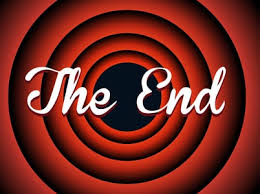